In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import warnings
import re
import xgboost as xgb
import nltk
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import cross_val_score, KFold
from sklearn.feature_selection import SelectKBest, chi2,  mutual_info_classif, f_classif
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

In [333]:
import plotly.io as pio
pio.renderers.default='notebook'

In [3]:
warnings.filterwarnings('ignore')

In [4]:
pd.set_option('display.max_rows', None)

In [165]:
data = pd.read_excel(r"C:\Users\Xanim\OneDrive\Sabira\imdb_genres_dataset.xlsx", index_col = None)

In [6]:
data.head(5)

,movie_id,movie_name,year,certificate,runtime,genre,rating,description,director,director_id,star,star_id,votes,gross(in $)
0,tt9114286,Black Panther: Wakanda Forever,2022,PG-13,161 min,"Action, Adventure, Drama",6.9,The people of Wakanda fight to protect their h...,Ryan Coogler,/name/nm3363032/,"Letitia Wright, \nLupita Nyong'o, \nDanai Guri...","/name/nm4004793/,/name/nm2143282/,/name/nm1775...",204835.0,NaN
1,tt1630029,Avatar: The Way of Water,2022,PG-13,192 min,"Action, Adventure, Fantasy",7.8,Jake Sully lives with his newfound family form...,James Cameron,/name/nm0000116/,"Sam Worthington, \nZoe Saldana, \nSigourney We...","/name/nm0941777/,/name/nm0757855/,/name/nm0000...",295119.0,NaN
2,tt5884796,Plane,2023,R,107 min,"Action, Thriller",6.5,A pilot finds himself caught in a war zone aft...,Jean-FranÃ§ois Richet,/name/nm0724938/,"Gerard Butler, \nMike Colter, \nTony Goldwyn, ...","/name/nm0124930/,/name/nm1591496/,/name/nm0001...",26220.0,NaN
3,tt6710474,Everything Everywhere All at Once,2022,R,139 min,"Action, Adventure, Comedy",8.0,A middle-aged Chinese immigrant is swept up in...,"Dan Kwan, \nDaniel Scheinert",/name/nm3453283/,"Michelle Yeoh, \nStephanie Hsu, \nJamie Lee Cu...","/name/nm3215397/,/name/nm0000706/,/name/nm3513...",327858.0,NaN
4,tt5433140,Fast X,2023,NaN,NaN,"Action, Crime, Mystery",NaN,Dom Toretto and his family are targeted by the...,Louis Leterrier,/name/nm0504642/,"Vin Diesel, \nJordana Brewster, \nTyrese Gibso...","/name/nm0004874/,/name/nm0108287/,/name/nm0879...",NaN,NaN


In [7]:
data.columns

Index(['movie_id', 'movie_name', 'year', 'certificate', 'runtime', 'genre',
       'rating', 'description', 'director', 'director_id', 'star', 'star_id',
       'votes', 'gross(in $)'],
      dtype='object')

In [8]:
data.shape

(368300, 14)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368300 entries, 0 to 368299
Data columns (total 14 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   movie_id     368300 non-null  object 
 1   movie_name   368292 non-null  object 
 2   year         315052 non-null  object 
 3   certificate  104191 non-null  object 
 4   runtime      259146 non-null  object 
 5   genre        368300 non-null  object 
 6   rating       230938 non-null  float64
 7   description  368288 non-null  object 
 8   director     340931 non-null  object 
 9   director_id  340931 non-null  object 
 10  star         309605 non-null  object 
 11  star_id      316442 non-null  object 
 12  votes        230942 non-null  float64
 13  gross(in $)  25039 non-null   float64
dtypes: float64(3), object(11)
memory usage: 39.3+ MB


In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
rating,230938.0,5.831825e+00,1.324856e+00,1.0,5.0,6.0,6.7,10.0
votes,230942.0,9.621306e+03,5.844606e+04,5.0,37.0,184.0,1181.0,2675531.0
gross(in $),25039.0,2.963822e+07,6.303061e+07,1.0,314170.0,5017971.0,31052363.5,936662225.0


# Data Cleaning

In [12]:
data.isnull().sum()

movie_id            0
movie_name          8
year            53248
certificate    264109
runtime        109154
genre               0
rating         137362
description        12
director        27369
director_id     27369
star            58695
star_id         51858
votes          137358
gross(in $)    343261
dtype: int64

In [13]:
percent_of_null_values = []

for col in data.columns:
    percent_of_null_values.append(data[col].isnull().sum()/ len(data) * 100)
df1 = pd.DataFrame({'Column' : data.columns})
df2 = pd.DataFrame({'Percent' : percent_of_null_values})
pd.concat([df1, df2], axis = 1)

,Column,Percent
0,movie_id,0.000000
1,movie_name,0.002172
2,year,14.457779
3,certificate,71.710291
4,runtime,29.637252
5,genre,0.000000
6,rating,37.296226
7,description,0.003258
8,director,7.431170
9,director_id,7.431170


In [167]:
data.replace('', np.nan, inplace=True)

<Axes: >

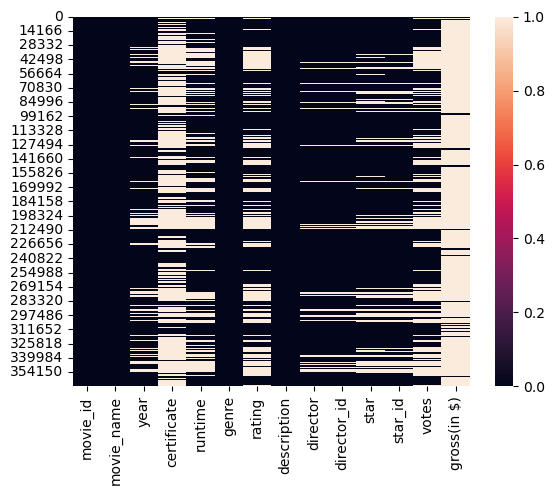

In [15]:
sns.heatmap(data.isnull())

In [16]:
data.duplicated().sum()

111272

In [169]:
df = data.drop_duplicates().reset_index()
df.shape

(257028, 15)

In [171]:
#Calculate the number of null values in each row
null_counts = df.isnull().sum(axis=1)
#Filter out rows where the number of null values is greater than 9
filtered_rows = df[null_counts <= 9]

#Create a new DataFrame with the filtered rows
new_df = filtered_rows.copy()

In [19]:
new_df.shape

(242734, 15)

We need to know unique values of each column so for knowing more about null values or empty values in data. So we do EDA a little bit

* Cleaning individual columns

In [22]:
new_df.columns

Index(['index', 'movie_id', 'movie_name', 'year', 'certificate', 'runtime',
       'genre', 'rating', 'description', 'director', 'director_id', 'star',
       'star_id', 'votes', 'gross(in $)'],
      dtype='object')

_Column : movie_id_

In [24]:
new_df.movie_id.unique()

array(['tt9114286', 'tt1630029', 'tt5884796', ..., 'tt26684378',
       'tt26690183', 'tt26733697'], dtype=object)

In [25]:
len(new_df.movie_id.unique())

228911

In [173]:
new_df['movie_id'] = new_df['movie_id'].str.replace('tt', '')

In [175]:
new_df['movie_id'] = new_df['movie_id'].astype(int)

_Column : movie_name_

In [29]:
new_df[pd.isna(df['movie_name'])]

,index,movie_id,movie_name,year,certificate,runtime,genre,rating,description,director,director_id,star,star_id,votes,gross(in $)
14130,14130,5774076,NaN,2015,NaN,NaN,"Action, Drama, Mystery",NaN,Two boys throw a party while their parents are...,G.M. Whiting,/name/nm6825011/,"Israel Adam, \nBrock Brazda, \nLanden James, \...","/name/nm6833864/,/name/nm6825012/,/name/nm6825...",NaN,NaN
39933,39933,9761088,NaN,2019,NaN,NaN,"Action, Adventure, Drama",NaN,Add a Plot,Lorenzo D'Amelio,/name/nm6690274/,"Chiara Attanasio, \nPeppe Barile, \nAngela Ros...","/name/nm10467155/,/name/nm7385597/,/name/nm928...",NaN,NaN
127523,159891,9381666,NaN,NaN,NaN,NaN,"Comedy, Fantasy, Horror",NaN,Three students take a strange drink that will ...,"Carlos Bardem, \nSalva Reina, \nCarmen Muga, \...",/name/nm0054214/,NaN,"/name/nm1892699/,/name/nm6970262/,/name/nm7575...",NaN,NaN
249674,354393,17042812,NaN,2010,NaN,87 min,Thriller,NaN,"A survival game show on the web, abandons cont...",Christopher Fink,/name/nm0002714/,"Linda Alcazar, \nAndre Johnson, \nBonnie McBri...","/name/nm1785036/,/name/nm13299177/,/name/nm132...",NaN,NaN


_Column : year_

In [31]:
new_df.year.unique()

array([2022, 2023, 2018, 1986, 2009, 2012, 2021, 2001, 2008, 2010, 2000,
       2019, 2014, 2017, 1999, 1981, 1996, 2020, 1995, 1993, 1988, 2015,
       2003, 2013, 1994, 1989, 1977, 2016, 2002, 2011, 1982, 1984, 1991,
       2007, 1997, 2006, 2004, 2005, 2024, 1987, 1967, 2026, 1963, 1964,
       nan, 1979, 1965, 1980, 1998, 1983, 1990, 2025, 1962, 1992, 1985,
       1978, 1960, 1976, 1954, 'I', 'II', 1938, 1971, 1959, 1973, 1969,
       1974, 1945, 1940, 1968, 1946, 1972, 1975, 1952, 1948, 1966, 1935,
       1961, 1953, 1970, 1958, 1932, 1947, 'V', 1926, 1927, 1941, 2028,
       1957, 1943, 1924, 2027, 1949, 1936, 'III', 1950, 'VII', 1955, 1934,
       1956, 1951, 'XXVI', 1923, 1915, 'IV', 1939, 1931, 1942, 'XXIII',
       1944, 1928, 1937, 'IX', 1918, 1920, 'XV', 1916, 1914, 1929, 'VI',
       'X', 1933, 1925, 'XIV', 1921, 1930, 'XIX', 'XXIX', 1906, 'XXI',
       'VIII', 'XI', 'XVIII', 'XII', 1922, 'XIII', 1919, 'LXXI', 'XVI',
       'XX', 'XXXIII', 'XXXII', 'XXXVI', 1917, 'XVII', '

In [177]:
rome_numbers = ['X', 'L', 'C', 'I', 'V']
for i in rome_numbers:
    new_df['year'] = np.where(np.array([i in str(x) for x in new_df['year']]), np.nan, new_df['year'])
new_df.year.unique()

array([2022, 2023, 2018, 1986, 2009, 2012, 2021, 2001, 2008, 2010, 2000,
       2019, 2014, 2017, 1999, 1981, 1996, 2020, 1995, 1993, 1988, 2015,
       2003, 2013, 1994, 1989, 1977, 2016, 2002, 2011, 1982, 1984, 1991,
       2007, 1997, 2006, 2004, 2005, 2024, 1987, 1967, 2026, 1963, 1964,
       nan, 1979, 1965, 1980, 1998, 1983, 1990, 2025, 1962, 1992, 1985,
       1978, 1960, 1976, 1954, 1938, 1971, 1959, 1973, 1969, 1974, 1945,
       1940, 1968, 1946, 1972, 1975, 1952, 1948, 1966, 1935, 1961, 1953,
       1970, 1958, 1932, 1947, 1926, 1927, 1941, 2028, 1957, 1943, 1924,
       2027, 1949, 1936, 1950, 1955, 1934, 1956, 1951, 1923, 1915, 1939,
       1931, 1942, 1944, 1928, 1937, 1918, 1920, 1916, 1914, 1929, 1933,
       1925, 1921, 1930, 1906, 1922, 1919, 1917, 1913, 1912, 1910, 1911,
       1908, 2029, 1909, 1903, 1907, 1905, 1894], dtype=object)

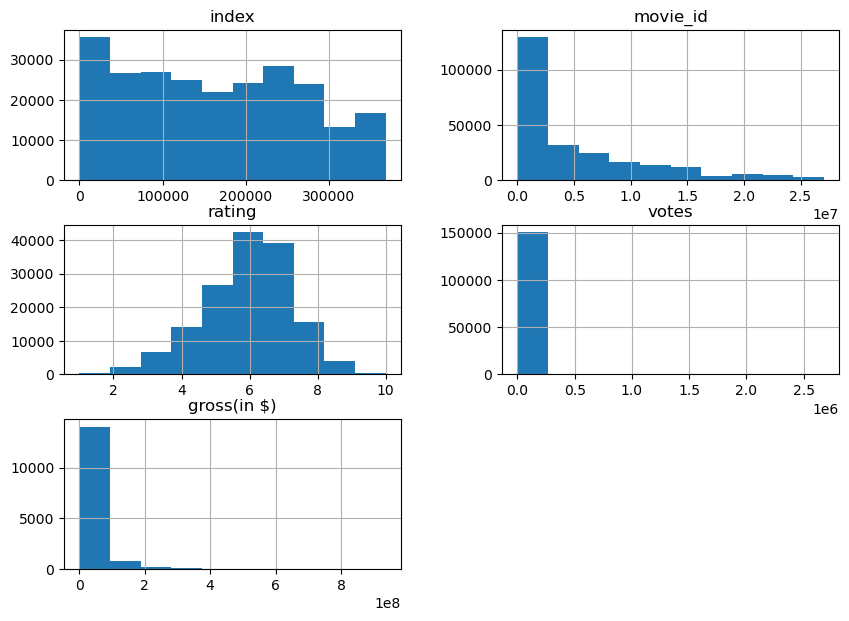

In [185]:
new_df.hist(figsize = (10, 7));

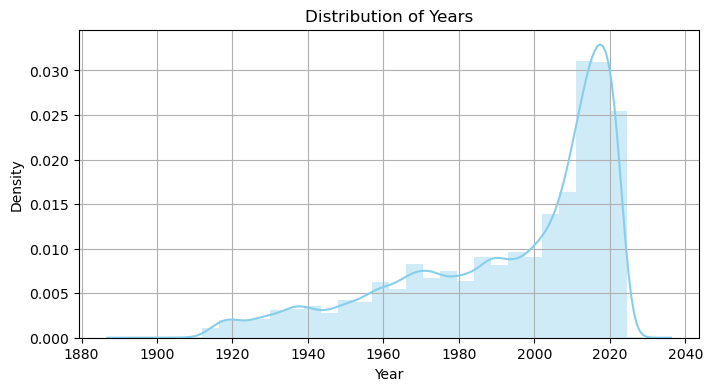

In [33]:
import seaborn as sns

years = new_df['year'].dropna()
# Create a distribution plot of the 'year' column
plt.figure(figsize=(8, 4))
sns.distplot(years, bins=30, kde=True, color='skyblue')
plt.title('Distribution of Years')
plt.xlabel('Year')
plt.ylabel('Density')
plt.grid(True)
plt.show()

In [34]:
np.median(new_df['year'])

2005.5

In [187]:
new_df['year'] = new_df['year'].fillna(np.median(new_df['year']))

In [189]:
new_df.year = new_df['year'].astype(int)

In [191]:
new_df['year'] = np.where(new_df['year'] > 2024, 2024, new_df['year'])

_Column : certificate_

In [39]:
new_df['certificate'].unique()

array(['PG-13', 'R', nan, 'Not Rated', 'TV-MA', 'PG', 'TV-14', '18+',
       'Approved', '13+', 'G', 'Unrated', 'Passed', 'M/PG', 'M', 'TV-PG',
       'TV-Y7', 'GP', 'TV-G', 'NC-17', '16+', 'X', 'TV-Y7-FV', 'TV-Y', 12,
       'MA-13', 'E', 'T', 'E10+', 'Open', 'AO', 'TV-13', 'F', 'A', 'U',
       'MA-17', 18, 'UA 7+', 'UA', 'UA 16+', 13, 16, 7, 'UA 13+', 'All'],
      dtype=object)

PG - Parental guidance required;
PG-13 - Customer may be aged 13 years and under, but must be accompanied by someone 13 years old or older;
13+ - Teens (13+);
R - Restricted. Passed only for persons 18 and over;
A - Passed only for persons 18 and over;
U - (Universal) general viewing for all ages;
G - suitable for all ages;
T - all audiences;
M - 15+ Recommended;
E - Exempt from classification;
TV-PG - Kids;
TV-Y7 - Kids;
TV-Y7-FV - Kids;
TV-Y - Kids;
TV-G - Kids;
TV-MA - Adult;
NC-17 - Adult;
12 - Suitable for 12 and above;
UA 7+ - Unrestricted Public Exhibition - but with a word of caution that Parental discretion required for children below 7 years;
UA 13+ - Unrestricted Public Exhibition - but with a word of caution that Parental discretion required for children below 13 years;
UA 16+ - Unrestricted Public Exhibition - but with a word of caution that Parental discretion required for children below 16 years;
Approved - Pre-1968 titles only (from the MPA site) Under the Hays Code, films were simply approved or disapproved based on whether they were deemed 'moral' or 'immoral'.);
X – Extreme content, available for distribution to over 18s in designated venues only

In [193]:
certificate_counts = new_df['certificate'].value_counts()
certificate_counts_table = pd.DataFrame({'Certificate' : certificate_counts.index, 'Count': certificate_counts.values})
certificate_counts_table.head(20)

,Certificate,Count
0,Not Rated,18083
1,R,14883
2,Approved,5767
3,Passed,5145
4,PG-13,4995
5,PG,4849
6,Unrated,2219
7,TV-MA,1735
8,TV-14,1545
9,G,1487


_Column : runtime (with minutes)_

In [43]:
new_df['runtime'].head()

0    161 min
1    192 min
2    107 min
3    139 min
4        NaN
Name: runtime, dtype: object

In [195]:
new_df['runtime'] = new_df['runtime'].str.replace('min', '')

In [197]:
new_df['runtime'] = new_df['runtime'].str.replace(',', '.')

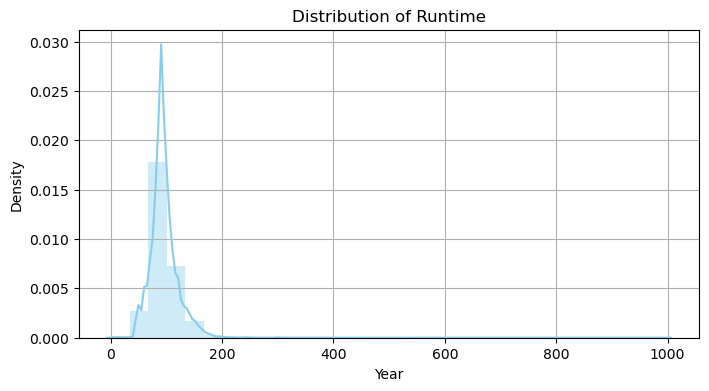

In [46]:
runtimes = new_df['runtime'].dropna()
plt.figure(figsize=(8, 4))
sns.distplot(runtimes, bins=30, kde=True, color='skyblue')
plt.title('Distribution of Runtime')
plt.xlabel('Year')
plt.ylabel('Density')
plt.grid(True)
plt.show()

In [199]:
new_df['runtime'] = new_df['runtime'].astype(float).round(2)

In [201]:
new_df['runtime'] = new_df['runtime'].fillna(np.mean(new_df['runtime']))

In [203]:
new_df.tail(2)

,index,movie_id,movie_name,year,certificate,runtime,genre,rating,description,director,director_id,star,star_id,votes,gross(in $)
257025,368296,26690183,World War 1 project,2005,NaN,95.648017,War,NaN,Add a Plot,"Dominic Higgins, \nIan Higgins",/name/nm3836407/,NaN,/name/nm3838864/,NaN,NaN
257027,368299,26733697,Spion 11: Operasjon Traelandsfos,2001,NaN,75.000000,"Comedy, War",NaN,Add a Plot,"Stein Vidar Aamodt, \nOve Olsen, \nJarle Solberg",/name/nm14562635/,"Andreas Hansen, \nTom Galdal, \nJarle Solberg,...","/name/nm14562634/,/name/nm14562633/,/name/nm14...",NaN,NaN


_Column : genre_

In [51]:
new_df['genre'].head()

0      Action, Adventure, Drama
1    Action, Adventure, Fantasy
2              Action, Thriller
3     Action, Adventure, Comedy
4        Action, Crime, Mystery
Name: genre, dtype: object

_Column : rating_

In [53]:
new_df['rating'].unique()

array([ 6.9,  7.8,  6.5,  8. ,  nan,  6.6,  5.4,  7.3,  8.3,  5.6,  7.9,
        6.4,  6.7,  7.2,  7.1,  7. ,  8.8,  6.3,  4.6,  9. ,  8.2,  8.5,
        8.4,  5.7,  4.8,  7.4,  5.2,  8.7,  7.5,  6.8,  3.5,  6.1,  8.1,
        6. ,  7.6,  8.6,  5.8,  5.9,  7.7,  5.1,  5.5,  5.3,  6.2,  4.1,
        4. ,  3. ,  4.3,  3.7,  4.9,  4.5,  4.7,  3.6,  5. ,  2.5,  3.9,
        3.4,  3.1,  3.8,  4.4,  1.3,  3.2,  8.9,  2.9,  4.2,  2.4,  2.1,
        3.3,  2.3,  2.8,  2.7,  2. ,  2.2,  1.9,  9.2,  1.4,  2.6,  1.2,
        9.1,  1.5,  1.6,  9.4,  1.7,  9.6,  1.8, 10. ,  1.1,  9.5,  9.3,
        9.7,  9.9,  9.8,  1. ])

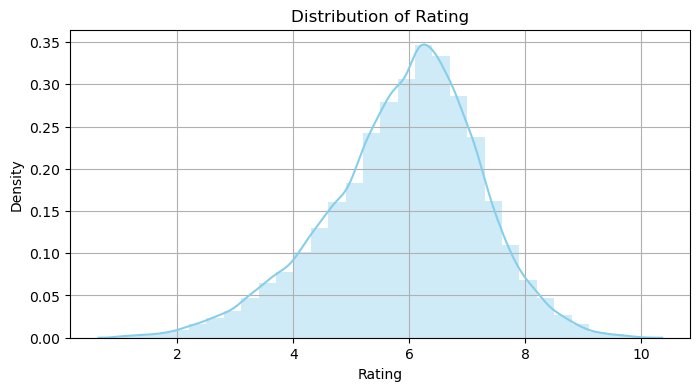

In [54]:
ratings = new_df['rating'].dropna()
plt.figure(figsize=(8, 4))
sns.distplot(ratings, bins=30, kde=True, color='skyblue')
plt.title('Distribution of Rating')
plt.xlabel('Rating')
plt.ylabel('Density')
plt.grid(True)
plt.show()

In [211]:
new_df.rating = new_df['rating'].astype(float).round(1)

In [207]:
new_df['rating'] = new_df['rating'].fillna(np.mean(new_df['rating']))

In [213]:
pd.DataFrame(new_df.rating.value_counts()).head(5)

,count
rating,
5.9,95210
6.2,5578
6.4,5295
6.3,5163
6.1,5072


_Column : director_

In [215]:
new_df['director'] = new_df['director'].str.replace('\n', '')

In [217]:
character_mapping = {
    'Ã©': 'é',
    'Ã¸': 'ø',
    'Ã«': 'ë',
    'Ã¼': 'ü',
    'Ã³': 'ó',
    'Ã–': 'ö',
    'Ã¶': 'ö',
    'Ã´': 'ō',
    'Ã¡': 'á',
    'Ã§': 'ç',
    'Ãº': 'ú',
    'Ãœ': 'ü',
    'Ã': 'í',
    'Ã‡': 'Ç',
    '¥': 'a'
}

# Define a function to replace substrings based on the character mapping
def replace_substring(value):
    if isinstance(value, str):  # Check if the value is a string
        for source, target in character_mapping.items():
            value = value.replace(source, target)
    return value

# Apply the function to every element in the DataFrame using applymap()
new_df = new_df.applymap(replace_substring)

In [219]:
pd.DataFrame(new_df['director'].value_counts()).head(5)

,count
director,
William Beaudine,129
Lew Landers,128
Richard Thorpe,125
Godfrey Ho,120
Jesús Franco,120


In [62]:
new_df['director'].fillna(new_df['director'].mode()[0], inplace = True) #

In [63]:
new_df['director'].isnull().sum() #

0

_Column : director_id_

In [65]:
pd.DataFrame(new_df['director_id'].unique()).head(5)

,0
0,/name/nm3363032/
1,/name/nm0000116/
2,/name/nm0724938/
3,/name/nm3453283/
4,/name/nm0504642/


In [221]:
new_df['director_id'] = new_df['director_id'].str.replace('/name/nm', '')
new_df['director_id'] = new_df['director_id'].str.replace('/', '')

In [223]:
new_df['director_id'].fillna(new_df['director_id'].mode()[0], inplace = True)

In [225]:
new_df['director_id'].isnull().sum()

0

In [227]:
new_df['director_id'] = new_df['director_id'].astype(int) #not really necessary

_Column : star_

In [71]:
new_df['star'].unique()

array(["Letitia Wright, \nLupita Nyong'o, \nDanai Gurira, \nWinston Duke",
       'Sam Worthington, \nZoe Saldana, \nSigourney Weaver, \nStephen Lang',
       'Gerard Butler, \nMike Colter, \nTony Goldwyn, \nYoson An', ...,
       'Martin Pautard, \nMohamed Seghir Bendaoud, \nMatthieu Brion, \nColette Kraffe',
       'Montagu Love, \nKitty Gordon, \nJune Elvidge, \nCarlyle Blackwell',
       'Andreas Hansen, \nTom Galdal, \nJarle Solberg, \nOve Olsen'],
      dtype=object)

In [229]:
new_df['star'] = new_df['star'].str.replace('\n', '')

_Column : star_id_

In [74]:
new_df['star_id'].unique()

array(['/name/nm4004793/,/name/nm2143282/,/name/nm1775091/,/name/nm6328300/',
       '/name/nm0941777/,/name/nm0757855/,/name/nm0000244/,/name/nm0002332/',
       '/name/nm0124930/,/name/nm1591496/,/name/nm0001282/,/name/nm5256788/',
       ...,
       '/name/nm0461295/,/name/nm0002311/,/name/nm0330373/,/name/nm0255827/,/name/nm0085877/',
       '/name/nm3838864/',
       '/name/nm14562634/,/name/nm14562633/,/name/nm14562636/,/name/nm14562637/,/name/nm14562633/,/name/nm14562634/'],
      dtype=object)

In [231]:
new_df['star_id'] = new_df['star_id'].str.replace('/', '')

In [233]:
new_df['star_id'] = new_df['star_id'].str.replace('namenm', '')

In [235]:
new_df['star_id'].head(5)

0            4004793,2143282,1775091,6328300
1            0941777,0757855,0000244,0002332
2            0124930,1591496,0001282,5256788
3    3215397,0000706,3513533,0000130,0702841
4            0004874,0108287,0879085,0735442
Name: star_id, dtype: object

_Column : votes_

In [79]:
pd.DataFrame(new_df['votes'].unique()).tail(5)

,0
18644,11690.0
18645,7931.0
18646,7953.0
18647,3255.0
18648,1527.0


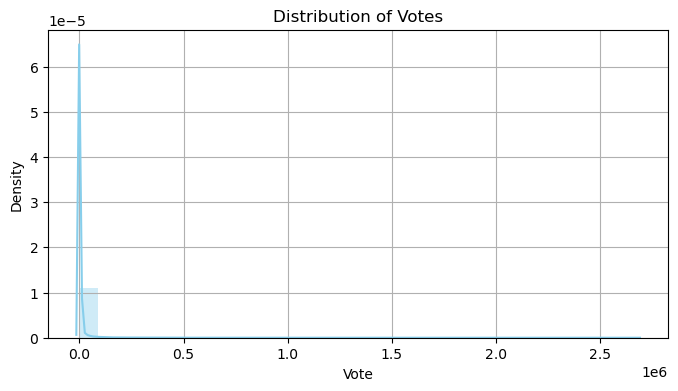

In [80]:
votes = new_df['votes'].dropna()
plt.figure(figsize=(8, 4))
sns.distplot(votes, bins=30, kde=True, color='skyblue')
plt.title('Distribution of Votes')
plt.xlabel('Vote')
plt.ylabel('Density')
plt.grid(True)
plt.show()

In [237]:
new_df['votes'] = new_df['votes'].fillna(np.mean(new_df['votes']))

In [239]:
new_df['votes'] = new_df['votes'].astype(int)

_Column : Gross_

In [84]:
pd.DataFrame(new_df['gross(in $)'].unique()).head()

,0
0,NaN
1,700059566.0
2,179800601.0
3,760507625.0
4,408010692.0


In [85]:
percent_of_null_values = []

for col in new_df.columns:
    percent_of_null_values.append(new_df[col].isnull().sum()/ len(new_df) * 100)
df1 = pd.DataFrame({'Column' : new_df.columns})
df2 = pd.DataFrame({'Percent' : percent_of_null_values})
pd.concat([df1, df2], axis = 1)

,Column,Percent
0,index,0.000000
1,movie_id,0.000000
2,movie_name,0.001648
3,year,0.000000
4,certificate,74.064614
5,runtime,0.000000
6,genre,0.000000
7,rating,0.000000
8,description,0.002884
9,director,0.000000


* Dropping rows where movie_name is null

In [241]:
new_df = new_df.dropna(subset=['movie_name'])

In [243]:
new_df['description'] = new_df['description'].fillna('Add a Plot')

In [245]:
new_df['certificate'] = new_df['certificate'].fillna('Unknown')

In [90]:
new_df['Age_category'] = new_df['Age_category'].fillna('Unknown') #

KeyError: 'Age_category'

In [247]:
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
index,242730.0,1.633799e+05,1.042410e+05,0.0,71179.25,1.616925e+05,249430.75,368299.0
movie_id,242730.0,4.916359e+06,6.108366e+06,9.0,230590.25,2.199579e+06,7716306.00,27055121.0
year,242730.0,1.994952e+03,2.591352e+01,1894.0,1981.00,2.005000e+03,2014.00,2024.0
runtime,242730.0,9.564805e+01,2.243656e+01,1.0,87.00,9.564802e+01,99.00,999.0
rating,242730.0,5.896763e+00,1.040494e+00,1.0,5.70,5.900000e+00,6.30,10.0
director_id,242730.0,2.589810e+06,3.281021e+06,5.0,407648.00,9.459810e+05,3700324.75,14631840.0
votes,242730.0,8.270093e+03,4.344489e+04,5.0,81.00,1.480000e+03,8270.00,2675531.0
gross(in $),15221.0,2.715860e+07,6.094870e+07,1.0,265801.00,3.796699e+06,26483452.00,936662225.0


# Exploratory Data Analysis (EDA)

In [249]:
new_df.dtypes.value_counts()

object     7
int64      3
float64    3
int32      2
Name: count, dtype: int64

## Feature Enginnering

_Splitting star_id and star columns_

In [251]:
pd.set_option('display.max_columns', None)

In [253]:
max_length = []
for i in range(len(new_df)):
    if isinstance(new_df['star'].iloc[i], str):
        max_length.append(len(new_df['star'].iloc[i].split(',')))

for j in range(max(max_length)):
    new_df[f'star_{j+1}'] = new_df['star'].apply(lambda x: x.split(',')[j] if (isinstance(x, str) and len(x.split(',')) > j) else np.nan)
new_df.head(40)

,index,movie_id,movie_name,year,certificate,runtime,genre,rating,description,director,director_id,star,star_id,votes,gross(in $),star_1,star_2,star_3,star_4,star_5
0,0,9114286,Black Panther: Wakanda Forever,2022,PG-13,161.000000,"Action, Adventure, Drama",6.9,The people of Wakanda fight to protect their h...,Ryan Coogler,3363032,"Letitia Wright, Lupita Nyong'o, Danai Gurira, ...","4004793,2143282,1775091,6328300",204835,NaN,Letitia Wright,Lupita Nyong'o,Danai Gurira,Winston Duke,NaN
1,1,1630029,Avatar: The Way of Water,2022,PG-13,192.000000,"Action, Adventure, Fantasy",7.8,Jake Sully lives with his newfound family form...,James Cameron,116,"Sam Worthington, Zoe Saldana, Sigourney Weaver...","0941777,0757855,0000244,0002332",295119,NaN,Sam Worthington,Zoe Saldana,Sigourney Weaver,Stephen Lang,NaN
2,2,5884796,Plane,2023,R,107.000000,"Action, Thriller",6.5,A pilot finds himself caught in a war zone aft...,Jean-François Richet,724938,"Gerard Butler, Mike Colter, Tony Goldwyn, Yoso...","0124930,1591496,0001282,5256788",26220,NaN,Gerard Butler,Mike Colter,Tony Goldwyn,Yoson An,NaN
3,3,6710474,Everything Everywhere All at Once,2022,R,139.000000,"Action, Adventure, Comedy",8.0,A middle-aged Chinese immigrant is swept up in...,"Dan Kwan, Daniel Scheinert",3453283,"Michelle Yeoh, Stephanie Hsu, Jamie Lee Curtis...","3215397,0000706,3513533,0000130,0702841",327858,NaN,Michelle Yeoh,Stephanie Hsu,Jamie Lee Curtis,Ke Huy Quan,NaN
4,4,5433140,Fast X,2023,Unknown,95.648017,"Action, Crime, Mystery",5.9,Dom Toretto and his family are targeted by the...,Louis Leterrier,504642,"Vin Diesel, Jordana Brewster, Tyrese Gibson, M...","0004874,0108287,0879085,0735442",8270,NaN,Vin Diesel,Jordana Brewster,Tyrese Gibson,Michelle Rodriguez,NaN
5,5,10954600,Ant-Man and the Wasp: Quantumania,2023,PG-13,125.000000,"Action, Adventure, Comedy",6.6,"Scott Lang and Hope Van Dyne, along with Hank ...",Peyton Reed,715636,"Paul Rudd, Evangeline Lilly, Jonathan Majors, ...","0748620,1431940,3718007,1105980",5396,NaN,Paul Rudd,Evangeline Lilly,Jonathan Majors,Kathryn Newton,NaN
6,6,9686790,Shotgun Wedding,2022,R,100.000000,"Action, Comedy, Romance",5.4,Darcy and Tom gather their families for the ul...,Jason Moore,601337,"Jennifer Lopez, Josh Duhamel, Lenny Kravitz, J...","0000182,0241049,0005107,0177639",21529,NaN,Jennifer Lopez,Josh Duhamel,Lenny Kravitz,Jennifer Coolidge,NaN
7,7,12593682,Bullet Train,2022,R,127.000000,"Action, Comedy, Thriller",7.3,Five assassins aboard a swiftly-moving bullet ...,David Leitch,500610,"Brad Pitt, Joey King, Aaron Taylor-Johnson, Br...","0000093,1428821,1093951,3109964",293635,NaN,Brad Pitt,Joey King,Aaron Taylor-Johnson,Brian Tyree Henry,NaN
8,8,1016150,All Quiet on the Western Front,2022,R,148.000000,"Action, Drama, War",7.8,A young German soldier's terrifying experience...,Edward Berger,74163,"Felix Kammerer, Albrecht Schuch, Aaron Hilmer,...","0436835,3477129,6037256,2714111",139754,NaN,Felix Kammerer,Albrecht Schuch,Aaron Hilmer,Moritz Klaus,NaN
9,9,1745960,Top Gun: Maverick,2022,PG-13,130.000000,"Action, Drama",8.3,"After thirty years, Maverick is still pushing ...",Joseph Kosinski,2676052,"Tom Cruise, Jennifer Connelly, Miles Teller, V...","0000129,0000124,1886602,0000174",526016,NaN,Tom Cruise,Jennifer Connelly,Miles Teller,Val Kilmer,NaN


Dropping star_id column

In [255]:
columns_to_drop = ['star_id', 'star', 'index']
new_df.drop(columns = columns_to_drop, inplace = True)

In [257]:
percent_of_null_values = []

for col in new_df.columns:
    null_count = new_df[col].isnull().sum()
    total_count = len(new_df)
    percent_null = (null_count / total_count) * 100
    if percent_null > 0:  #columns with zero null values
        percent_of_null_values.append(percent_null)

df_null_percentages = pd.DataFrame({
    'Column': new_df.columns[new_df.isnull().sum() > 0],  # Filter columns with null values
    'Percent': percent_of_null_values
})

print(df_null_percentages)

        Column    Percent
0     director   2.703415
1  gross(in $)  93.729246
2       star_1  12.440572
3       star_2  14.853953
4       star_3  17.111194
5       star_4  19.922136
6       star_5  99.998352


In [259]:
new_df = new_df.drop('star_5', axis = 1)

In [261]:
columns_to_fill = ['star_1', 'star_2', 'star_3', 'star_4']

for column in columns_to_fill:
    new_df[column].fillna('Unknown', inplace=True)  # Filling null values with 'Unknown'

In [265]:
pd.DataFrame(new_df['star_1'].value_counts()).tail()

,count
star_1,
Kurt Bonzell,1
Jean-Jacques Delbo,1
Kaja Trøa,1
Raimundo Blumette,1
Andreas Hansen,1


In [267]:
pd.DataFrame(new_df['star_2'].value_counts()).head(8)

,count
star_2,
Unknown,36055
Rekha,84
Sridevi,75
Hema Malini,67
Brahmanandam,64
Mithun Chakraborty,63
Filiz Akin,61
Joan Bennett,59


In [269]:
pd.DataFrame(new_df['star_3'].value_counts()).tail(8)

,count
star_3,
Genia Nikolaieva,1
Haris Loupakis,1
Gerald Maliqi,1
Avdut Bhatt,1
Pat Attah,1
Lou D'Amato,1
Nikolay Penkov,1
Jarle Solberg,1


In [271]:
pd.DataFrame(new_df['star_4'].value_counts()).head(8)

,count
star_4,
Unknown,48357
Paquito Diaz,94
Brahmanandam,79
Shakti Kapoor,71
Prem Chopra,70
Gulshan Grover,61
Pran Sikand,60
Prakash Raj,60


* Function for adding decade as a new feature

In [273]:
def get_decade(year):
    return int(year / 10) * 10

In [275]:
new_df['Decade'] = new_df['year'].apply(get_decade)

In [356]:
new_df['Decade'].unique()

array([2020, 2010, 1980, 2000, 1990, 1970, 1960, 1950, 1930, 1940, 1920,
       1910, 1900, 1890], dtype=int64)

*Note: Run after Runtime_category*

KeyboardInterrupt: 

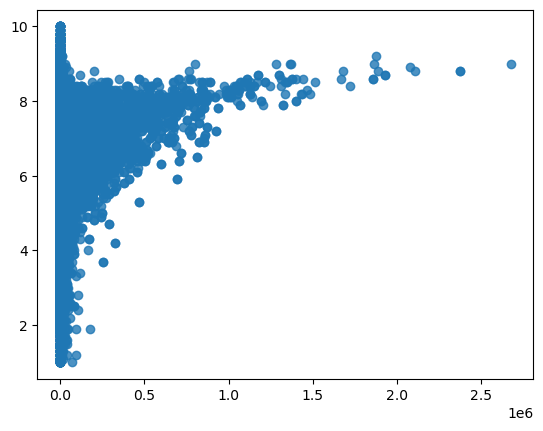

In [279]:
sns.regplot(data=new_df, x="votes", y="rating", order=2)

In [ ]:
sns.regplot(data=new_df, x="gross(in $)", y="rating", order=2)

The x-axis represents "gross (in $)" ranging from 0 to 800 million dollars, and the y-axis represents "rating" ranging from 0 to 10. The data points are more concentrated at lower gross values. There is a trend line on the plot, showing a slight upward trend as gross revenue increases, but the relationship is not strongly linear, and there is considerable variance in ratings across all levels of gross revenue

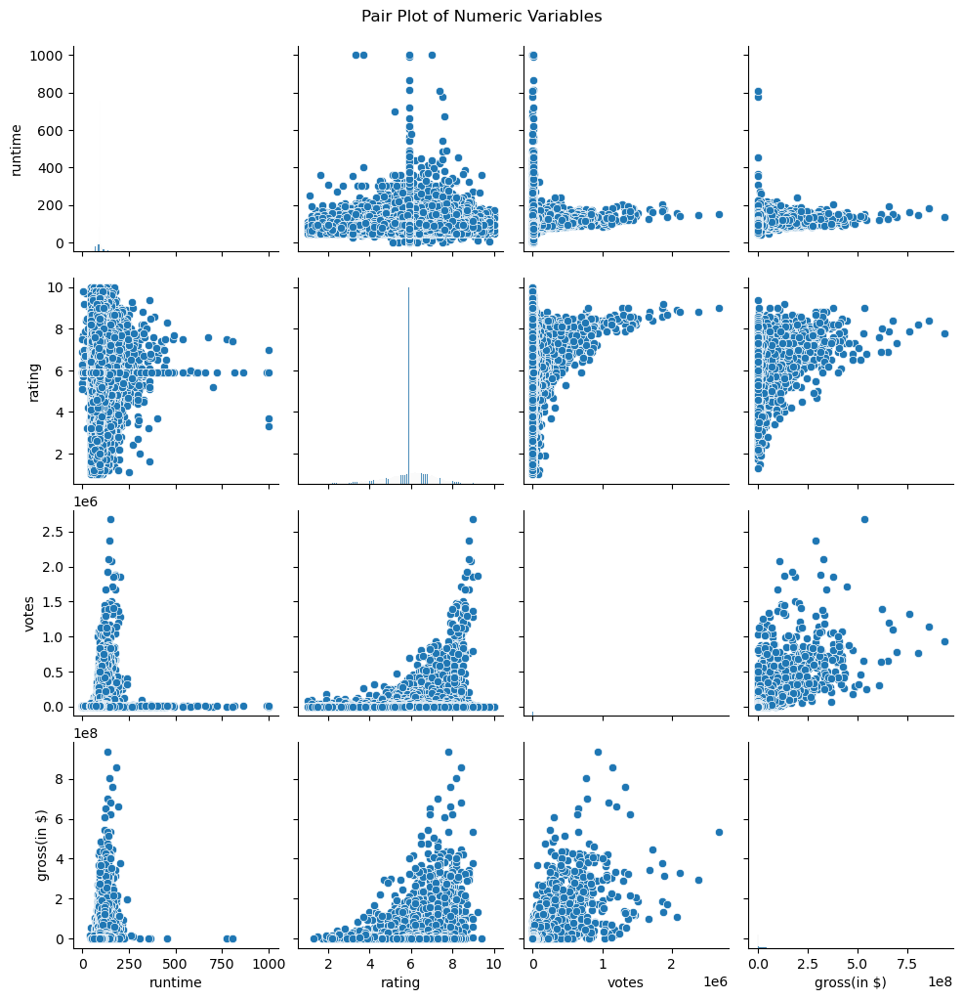

In [281]:
# Select numeric columns for pair plot
numeric_columns = ['runtime', 'rating', 'votes', 'gross(in $)']

custom_palette = "husl"
# Create pair plot
sns.pairplot(new_df[numeric_columns], palette=custom_palette)
plt.suptitle('Pair Plot of Numeric Variables', y=1.02)  # Add a title with some spacing
plt.show()

Observation:
* There is correlation between gross and votes

In [283]:
new_df['movie_name'] = new_df['movie_name'].astype(str)
new_df['description'] = new_df['description'].astype(str)

_Splitting movies like short, average-length, long according to runtime_

In [285]:
short_threshold = 40
long_threshold = 150

bins = [0, short_threshold, long_threshold, float('inf')]
labels = ['Short', 'Average', 'Long']


new_df['Runtime_category'] = pd.cut(new_df['runtime'], bins = bins, labels = labels, right = False)

In [287]:
new_df['Runtime_category'].unique()

['Long', 'Average', 'Short']
Categories (3, object): ['Short' < 'Average' < 'Long']

In [289]:
from nltk.tokenize import word_tokenize
from collections import Counter

# Function to tokenize and normalize text
def tokenize_text(text):
    tokens = word_tokenize(str(text).lower())  # Convert to lowercase and tokenize
    return [token for token in tokens if token.isalnum()]  # Remove punctuation

# Group titles by decade and concatenate them into a single string
titles_by_decade = new_df.groupby('Decade')['movie_name'].apply(lambda x: ' '.join(x))

# Tokenize titles by decade
tokenized_titles_by_decade = titles_by_decade.apply(tokenize_text)

# Compute word frequencies for each decade
word_frequencies_by_decade = tokenized_titles_by_decade.apply(lambda x: Counter(x))

# Print top 10 words for each decade
for decade, word_freq in word_frequencies_by_decade.items():
    print(f"Decade: {decade}")
    print(word_freq.most_common(10))
    print()

Decade: 1890
[('miss', 1), ('jerry', 1)]

Decade: 1900
[('the', 8), ('of', 5), ('and', 3), ('passion', 3), ('life', 3), ('story', 2), ('kelly', 2), ('gang', 2), ('christ', 2), ('zakura', 2)]

Decade: 1910
[('the', 1103), ('of', 383), ('der', 139), ('a', 135), ('die', 105), ('in', 82), ('and', 70), ('das', 70), ('man', 65), ('girl', 44)]

Decade: 1920
[('the', 1762), ('of', 610), ('a', 150), ('der', 148), ('in', 103), ('love', 93), ('die', 87), ('and', 82), ('man', 70), ('woman', 53)]

Decade: 1930
[('the', 1836), ('of', 655), ('a', 275), ('in', 256), ('to', 129), ('man', 124), ('and', 124), ('love', 115), ('on', 108), ('de', 94)]

Decade: 1940
[('the', 1656), ('of', 599), ('in', 276), ('a', 275), ('de', 158), ('and', 150), ('to', 141), ('la', 137), ('i', 111), ('el', 108)]

Decade: 1950
[('the', 2131), ('of', 708), ('a', 278), ('in', 275), ('de', 236), ('no', 235), ('and', 233), ('la', 225), ('el', 224), ('to', 202)]

Decade: 1960
[('the', 2441), ('of', 981), ('a', 424), ('no', 340), (

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all tokenized titles into a single text for each decade
text_by_decade = tokenized_titles_by_decade.apply(lambda x: ' '.join(x))

# Generate a word cloud for each decade
for decade, text in text_by_decade.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Word Cloud for Movie Titles ({decade}s)")
    plt.axis('off')
    plt.show()


In [293]:
decade_df = new_df.groupby(['Decade', 'Runtime_category'])['rating'].mean().round(2).sort_values(ascending=False).reset_index()

In [295]:
fig = px.bar(decade_df, x="Decade", y="rating", title="Ratings according decade")
fig.show()

* The more likely explanation is that movies from the 1950’s  through 1970’s have artificially higher scores because people don’t generally go back and watch the crummy movies of the last generation, so they get forgotten and do not have 1000 votes on IMDb.

* New column: age category according certificate column

In [297]:
age_mapping = {'all': ['U', 'G', 'T', 'TV-Y', 'TV-G', 'All', 'Approved'],
               'kids' : ['PG', 'TV-PG', 'UA 7+', 'TV-Y7', 'TV-Y7-FV', '7'],
               'teens' :  ['12', '13+', 'PG-13', 'UA 13+', 'UA 16+', 'M', '16', 'MA-13', 'TV-13', '13'],
               'adults':  ['TV-MA', 'R', 'A', 'NC-17', 'X', 'AO', 'MA-17', '18+', '18'],
               'others': ['Not Rated', 'Unrated', 'Passed', 'GP', 'E', 'E10+', 'Open', 'F', 'A']
              }

In [299]:
category_mapping = {v : k for k, values in age_mapping.items() for v in values}
new_df['Age_category'] = new_df['certificate'].map(category_mapping)

new_df['Age_category'].value_counts()

Age_category
others    25648
adults    16831
all        7794
kids       5847
teens      5114
Name: count, dtype: int64

In [301]:
category_df = new_df.groupby(['Decade', 'Age_category'])['rating'].median().sort_values(ascending=True).reset_index()

In [303]:
fig = px.bar(category_df, x="Decade", y="rating", color = "Age_category", barmode='group',
             height=400, title="Average Ratings by Decade")
fig.show()

* The movies aimed at teens tend to get more votes in last decades

In [305]:
len(df['certificate'].unique())

45

In [307]:
decade_votes = new_df.groupby(['Decade', 'Runtime_category'])['votes'].mean().round(2).sort_values(ascending=False).reset_index()

In [309]:
fig = px.histogram(decade_votes, x="Decade", y="votes", title="Votes according decade")
fig.show()

* Movies released in between 2000-2010 got more votes
Several factors could contribute to movies released between 2000 and 2010 receiving more votes on IMDb!:
1. **Increased Internet Usage**: The early 2000s saw a significant increase in internet usage and access, leading to more people using IMDb and other online platforms to rate and review movies. As internet penetration grew, so did the number of IMDb users, resulting in more votes for movies released during that period.

2. **Proliferation of Online Communities**: The rise of online communities and forums dedicated to movie discussions during the 2000s facilitated greater engagement with film-related content. IMDb became a popular platform for movie enthusiasts to share their opinions and ratings, leading to a higher volume of votes for movies released during that time frame.

3. **Availability of Information**: The 2000s marked a period of rapid expansion in the availability of movie-related information online. IMDb provided comprehensive details about movies, including cast, crew, plot summaries, and user ratings, making it easier for audiences to discover and engage with a wide range of films released during that period.

4. **Cultural Significance**: The 2000s witnessed the release of many culturally significant and influential movies across various genres. These movies often generated considerable buzz and discussion, prompting more people to seek them out on platforms like IMDb to rate and review them.

5. **Nostalgia Factor**: Movies released during the 2000s may hold a nostalgic appeal for audiences who grew up during that era. As a result, people may be more inclined to revisit and rate movies from their youth, contributing to higher vote counts for films released between 2000 and 2010.

6. **Longevity of Popular Films**: Many popular movies released during the 2000s have maintained their relevance and popularity over time. These enduring classics continue to attract new viewers and garner votes on IMDb, contributing to the overall higher vote count for movies from that period.

Overall, the combination of increased internet usage, the proliferation of online communities, the availability of information, cultural significance, nostalgia, and the longevity of popular films likely contributed to movies released between 2000 and 2010 receiving more votes on IMDb.

* First genre as main genre

In [311]:
main_genre = []

for i in new_df['genre']:
    main_genre.append(i.split(',')[0])

In [313]:
new_df['Main_genre'] = main_genre

In [315]:
facet_df = new_df.groupby(['votes', 'Runtime_category', 'Age_category'])['rating'].mean().sort_values(ascending=True).reset_index()

In [317]:
fig = px.scatter(facet_df, x="votes", y="rating", color="Runtime_category", facet_row="Age_category")
# Adjust the size of each facet
# Adjust the size of the entire plot
fig.update_layout(
    height=1000,  # Set the height of the entire plot
)
fig.show()

In [ ]:
len(new_df['certificate'].unique())

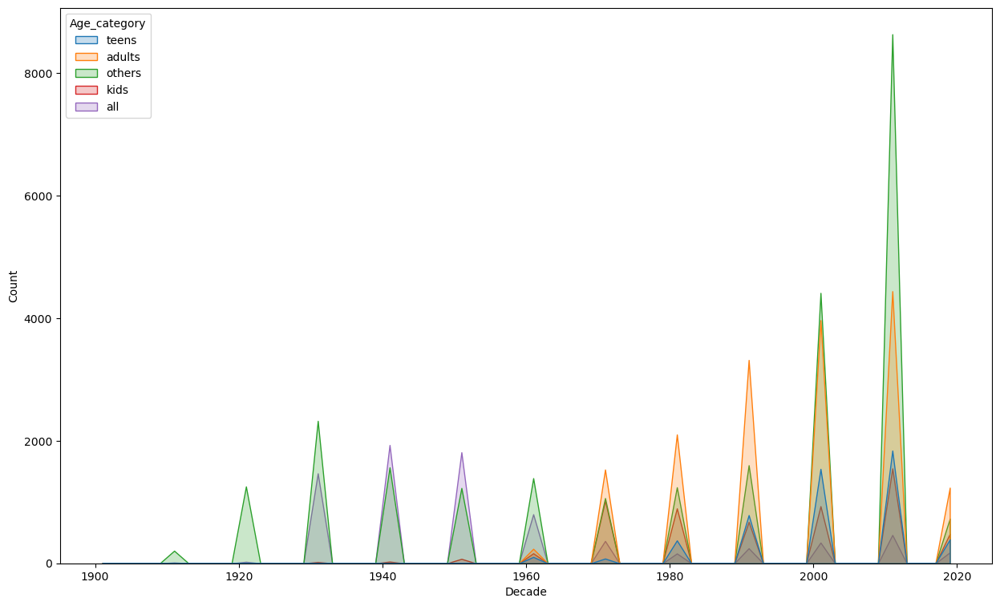

In [319]:
plt.figure(figsize=(15,9))
fig = sns.histplot(binwidth=2,
            x='Decade',
            hue='Age_category',
            data= new_df,
            stat="count",
            element = 'poly',
            color='blue')
sns.move_legend(fig, "upper left")

In [321]:
# Group by genre and count the occurrences
genre_counts = new_df['Main_genre'].value_counts()

# Get top 6 genres by total number of movies
top_6_genres = genre_counts.head(6)

print(top_6_genres)

Main_genre
Action       50192
Drama        42063
Comedy       31530
Horror       21613
Crime        21272
Adventure    15445
Name: count, dtype: int64


In [323]:
# Filter df DataFrame for movies made within a decade
filtered_movies = new_df[(new_df['year'] >= 2014) & (new_df['year'] <= 2024)]

# Group by decade and genre, and find the film with the maximum rating in each group
max_rating_films = filtered_movies.groupby(['Decade', 'Main_genre']).apply(lambda x: x.loc[x['rating'].idxmax()])

# Print the result
print(max_rating_films[['Main_genre', 'movie_name', 'rating']])

                   Main_genre  \
Decade Main_genre               
2010   Action          Action   
       Adventure    Adventure   
       Animation    Animation   
       Biography    Biography   
       Comedy          Comedy   
       Crime            Crime   
       Drama            Drama   
       Family          Family   
       Fantasy        Fantasy   
       History        History   
       Horror          Horror   
       Music            Music   
       Musical        Musical   
       Mystery        Mystery   
       Reality-TV  Reality-TV   
       Romance        Romance   
       Sci-Fi          Sci-Fi   
       Sport            Sport   
       Thriller      Thriller   
       War                War   
2020   Action          Action   
       Adult            Adult   
       Adventure    Adventure   
       Animation    Animation   
       Biography    Biography   
       Comedy          Comedy   
       Crime            Crime   
       Drama            Drama   
       Fam

In [325]:
# Group by decade and genre, and find the maximum rating for each group
max_ratings = new_df.groupby(['Decade', 'Main_genre'])['rating'].max().sort_values(ascending = False).reset_index()

# Filter data for each decade and create separate plots
for decade in max_ratings['Decade'].unique():
    # Filter dataframe for the current decade
    decade_data = max_ratings[max_ratings['Decade'] == decade]
    
    # Create bar plot for the current decade
    fig = px.bar(decade_data, x='Main_genre', y='rating', color='Main_genre',
                 title=f'Maximum Ratings for Each Main Genre in the {decade}s',
                 labels={'rating': 'Maximum Rating', 'Main_genre': 'Main Genre'},
                 height=400)
    
    # Rotate x-axis labels for better readability
    fig.update_layout(xaxis=dict(tickangle=45))
    
    # Show the plot
    fig.show()

In [327]:
# Plotting
fig = px.scatter(genre_counts_by_decade, x='Decade', y='count', color='Main_genre', 
                 title='Total Rated Films by Genre in Each Decade', 
                 labels={'Decade': 'Decade', 'count': 'Total Rated Films', 'Main_genre': 'Genre'},
                 category_orders={'Decade': sorted(genre_counts_by_decade['Decade'].unique())})
fig.update_layout(xaxis_title='Decade', yaxis_title='Total Rated Films', legend_title='Genre')
fig.show()

NameError: name 'genre_counts_by_decade' is not defined

In [ ]:
df.tail(4)

In [335]:
runtime_df = new_df.groupby('Runtime_category')['rating'].mean().round(1).sort_values(ascending=False).reset_index()
age_df = new_df.groupby('Age_category')['rating'].mean().round(1).sort_values(ascending=False).reset_index()

In [337]:
fig = px.pie(runtime_df, values='rating', names='Runtime_category', title='Rates according runtime category ', 
             template='plotly_dark', hole=0.5, 
             labels={'rating': 'Rating', 'Runtime_category': 'Runtime Category'})

fig.update_traces(textposition='inside', textinfo='percent+label')

fig_1 = px.pie(age_df, values='rating', names='Age_category', title='Ratings by age category',
               template='plotly_dark', hole=0.5, 
               labels={'rating': 'Rating', 'Age_category': 'Age Category'})

fig_1.update_traces(textposition='inside', textinfo='percent+label')

# Show subplots
fig.show()
fig_1.show()


* Long-form films and films intended for teenagers usually get higher ratings

In [339]:
genre_counts = pd.DataFrame(new_df['Main_genre'].value_counts()).sort_values(by='count', ascending=True).reset_index()

In [340]:
genre_count = new_df.groupby(['Decade', 'Main_genre'])['movie_id'].count().sort_values(ascending=True).reset_index()

## Number of Movies by Decade

In [341]:
for genre in new_df['Main_genre'].unique():
    genre_data = genre_count[genre_count['Main_genre'] == genre]
    
    # Creating the bar plot
    fig = px.bar(genre_data, x='Decade', y='movie_id', title=f'Number of Movies by Decade for {genre}',
                 labels={'Decade': 'Decade', 'movie_id': 'Number of Movies'}, color='Decade',
                 color_discrete_sequence=px.colors.qualitative.Pastel)
    
    # Customizing layout
    fig.update_layout(
        xaxis=dict(title='Decade', tickangle=45, tickfont=dict(size=12)),
        yaxis=dict(title='Number of Movies', tickfont=dict(size=12)),
        legend=dict(title='', orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
        title_font=dict(size=18, family='Arial', color='black'),
        plot_bgcolor='white',  # Setting plot background color
        bargap=0.2,  # Setting gap between bars
        margin=dict(l=50, r=50, t=80, b=50),  # Adjusting margin
        hovermode='x',  # Setting hover mode
        xaxis_showgrid=True,  
        yaxis_showgrid=True  
    )
    
    # Show the plot
    fig.show()

Most of the movies is action in recent years

In [342]:
votes_df = new_df.groupby(['Main_genre'])['votes'].mean().sort_values(ascending=True).reset_index()

In [343]:
fig = px.bar(votes_df, x="votes", y="Main_genre", title='Votes according genres')
fig.show()

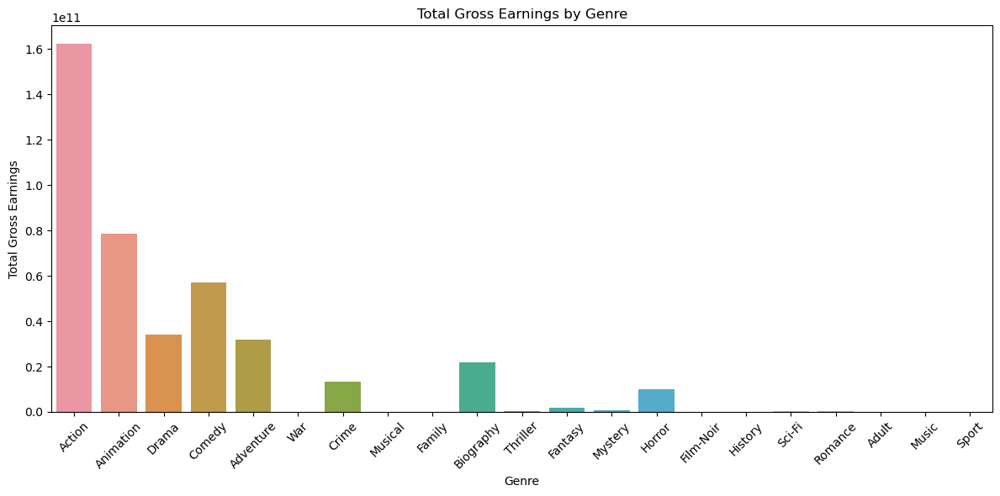

In [344]:
# Drop rows with null values in the 'Gross' column
gross_without_null = new_df.dropna(subset=['gross(in $)'])

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=gross_without_null, x='Main_genre', y='gross(in $)', estimator=sum, ci=None)
plt.title('Total Gross Earnings by Genre')
plt.xlabel('Genre')
plt.ylabel('Total Gross Earnings')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [345]:
votes_df = new_df.groupby(['Decade','Runtime_category'])['votes'].mean().sort_values(ascending=False).reset_index()

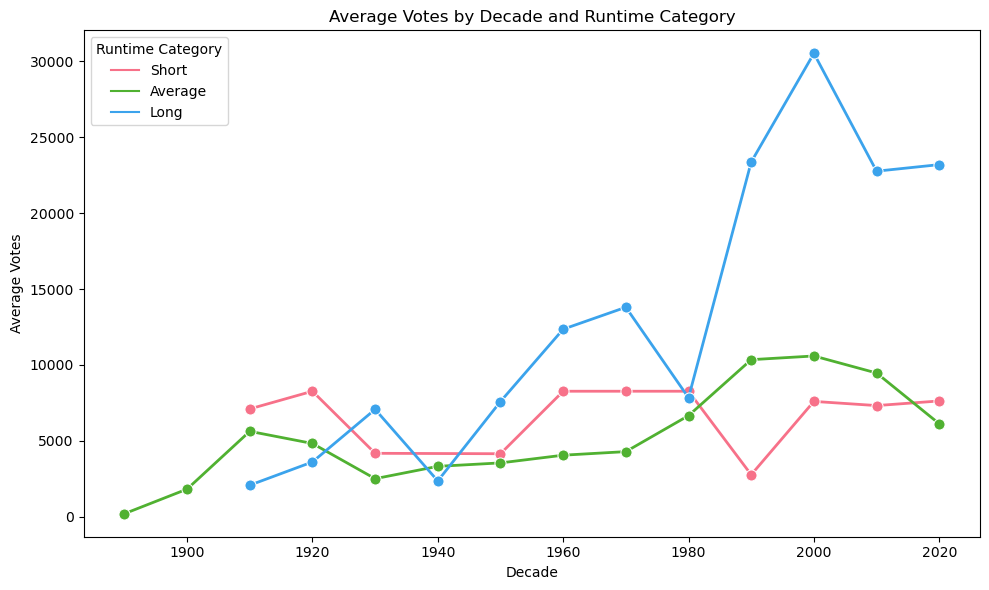

In [346]:
# Adjusting the color palette for better visualization
palette = sns.color_palette("husl", len(votes_df['Runtime_category'].unique()))

# Creating the line plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=votes_df, x="Decade", y="votes", hue="Runtime_category", palette=palette, marker='o', markersize=8, linewidth=2)

# Adding title and labels
plt.title('Average Votes by Decade and Runtime Category')
plt.xlabel('Decade')
plt.ylabel('Average Votes')

# Improving the legend
plt.legend(title='Runtime Category', loc='upper left')

# Adjusting the layout
plt.tight_layout()

# Display the plot
plt.show()


In [347]:
rates_df = new_df.groupby(['Decade', 'Age_category'])['rating'].mean().sort_values(ascending=False).reset_index()

<Figure size 1200x800 with 0 Axes>

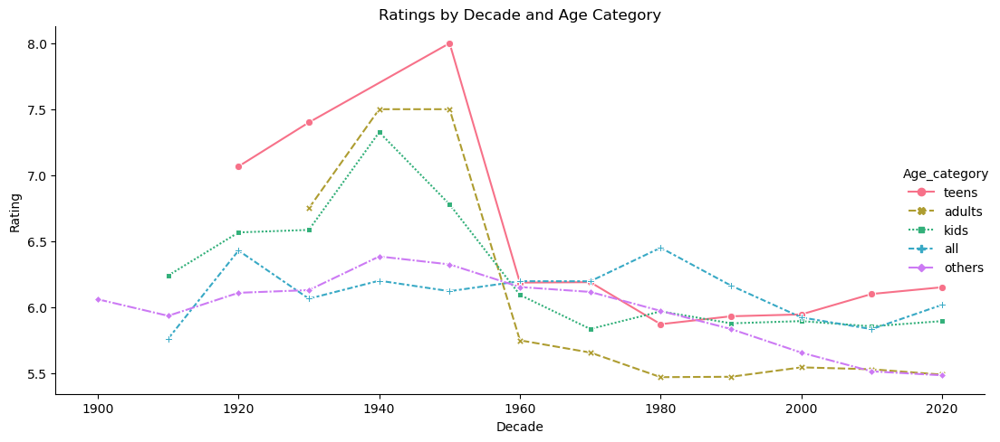

In [348]:
# Creating the relational plot
plt.figure(figsize=(12, 8))
sns.relplot(data=rates_df, x="Decade", y="rating", hue="Age_category", kind="line", aspect=2, markers=True, style="Age_category", palette="husl")

# Adding title and labels
plt.title('Ratings by Decade and Age Category')
plt.xlabel('Decade')
plt.ylabel('Rating')

# Adjusting the layout
plt.tight_layout()

# Display the plot
plt.show()

In [349]:
rates_df = new_df.groupby(['Main_genre', 'Runtime_category'])['rating'].mean().sort_values(ascending=False).reset_index()

In [350]:
# Creating the scatter plot
fig = px.scatter(rates_df, x="Main_genre", y="rating", color='Runtime_category', title='Ratings by Genre and Runtime Category')

# Adjusting marker size and opacity
fig.update_traces(marker=dict(size=10, opacity=0.8))
fig.update_layout(xaxis=dict(tickangle=45))
fig.show()

* The shorter the duration of horror films, the higher the probability of getting a good rating.
* In short mystery films, it tends to get more ratings

In [351]:
votes_df_2 = new_df.groupby(['Main_genre', 'Runtime_category'])['votes'].mean().sort_values(ascending=False).reset_index()

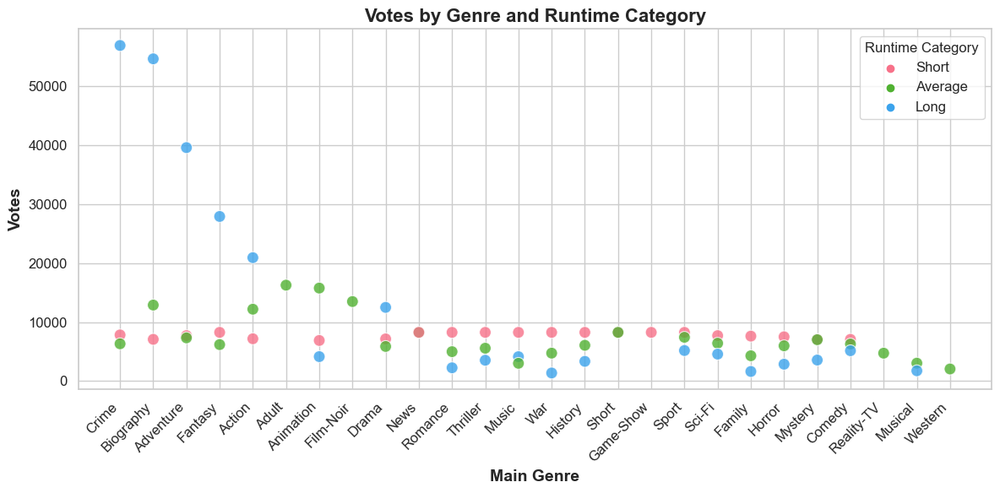

In [352]:
# Set the style of seaborn
sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))  
sns.scatterplot(data=votes_df_2, x="Main_genre", y="votes", hue="Runtime_category", palette="husl", s=100, alpha=0.8)
plt.xticks(rotation=45, ha='right', fontsize=12)  
plt.yticks(fontsize=12)  
plt.xlabel("Main Genre", fontsize=14, fontweight='bold') 
plt.ylabel("Votes", fontsize=14, fontweight='bold')  
plt.title("Votes by Genre and Runtime Category", fontsize=16, fontweight='bold') 
plt.legend(title='Runtime Category', fontsize=12, title_fontsize=12)  
plt.tight_layout()
plt.show()

In [ ]:
df.head()

In [353]:
vote_df = new_df.groupby(['Age_category'])['votes'].median().sort_values(ascending=False).reset_index()
vote_df

,Age_category,votes
0,teens,10689.5
1,kids,2297.0
2,adults,2044.0
3,others,548.0
4,all,521.0


In [ ]:
vote_df.columns

In [354]:
# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels= vote_df['Age_category'], values= vote_df['votes'], hole=.3)])
fig.update_layout(width=850, height=500, title_text="The median of the votes according age categories")
fig.show()

* Movies aimed at teenagers tend to get more votes

In [355]:
star_counts = df.groupby('Decade').agg({'star_1': 'value_counts', 'star_2': 'value_counts', 'star_3': 'value_counts', 'star_4': 'value_counts'}).reset_index()

KeyError: 'Decade'

In [ ]:
star_counts

In [358]:
for star in star_counts.columns:
    fig = px.bar(star_counts[star],
                 x=star_counts[star].index,
                 y=star_counts[star].values,
                 title=f'Number of Movies by Star Rating in the {star} Stars Category',
                 labels={'index': 'Decade', 'value': 'Number of Movies'})
    fig.update_layout(xaxis_tickangle=-45)
    fig.show()

AttributeError: 'dict' object has no attribute 'columns'

In [357]:
# Create a list of all star columns
star_columns = ['star_1', 'star_2', 'star_3', 'star_4']

# Create an empty dictionary to store star counts
star_counts = {}

# Iterate over star columns and count appearances
for column in star_columns:
    stars = df[column].value_counts()
    for star, count in stars.items():
        if star in star_counts:
            star_counts[star] += count
        else:
            star_counts[star] = count

# Create a dataframe from star_counts
star_df = pd.DataFrame.from_dict(star_counts, orient='index', columns=['Total Appearances'])


KeyError: 'star_1'

In [359]:
# keeping only first director

new_df['director'] = np.where(new_df['director'].str.contains(','), new_df['director'].str.split(',')[0], new_df['director'])

In [360]:
data_for_directors = data.copy()

In [361]:
data_for_directors = data_for_directors.drop_duplicates().reset_index()

In [362]:
data_for_directors['director'] = data_for_directors['director'].dropna()

In [363]:
director_counts = pd.DataFrame(data_for_directors['director'].value_counts()).sort_values(by='count', ascending=False).reset_index()

In [364]:
director_counts = director_counts.applymap(replace_substring)

In [365]:
top_director_counts = director_counts.head(25).sort_values(ascending = True, by = 'count')
top_director_counts

,director,count
24,Atif Yilmaz,81
22,ülkü Erakalin,81
23,René Cardona,81
21,K. Raghavendra Rao,82
20,Gilberto Martí­nez Solares,83
19,Orhan Elmas,84
18,Lloyd Bacon,86
17,Maurice Elvey,87
16,Cesar Gallardo,87
15,George B. Seitz,87


In [366]:
fig = px.bar(top_director_counts, x='count', y='director',
             title='Directors with Most Movies',
             labels={'director': 'Director', 'count': 'Number of Movies'},
             color_discrete_sequence=["red"])

# Customize the bar chart
fig.update_layout(
    title_font=dict(size=16),
    xaxis_title_font=dict(size=14),
    yaxis_title_font=dict(size=14),
    xaxis_tickangle=-45,
    yaxis=dict(tickfont=dict(size=12)),
    margin=dict(l=80, r=40, t=80, b=30),
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=False
)

# Display the bar chart
fig.show()

In [367]:
director_rating_sorted.head(20)

NameError: name 'director_rating_sorted' is not defined

In [368]:
# Grouping data by 'director' and calculating mean rating
director_rating = new_df.groupby('director')['rating'].median().reset_index()

# Sort directors by mean rating in descending order
director_rating_sorted = director_rating.sort_values(by='rating', ascending=False)

# Plotting the top-rated directors
fig = px.bar(director_rating_sorted.head(20), x='director', y='rating',
             title='Top 20 Directors by Median Rating', labels={'director': 'Director', 'rating': 'Median Rating'},
            color='rating', color_continuous_scale='viridis')
fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [369]:
# Combine ratings from all star columns into a single column
star_ratings = pd.concat([df['star_1'], df['star_2'], df['star_3']], ignore_index=True)

KeyError: 'star_1'

In [ ]:
star_ratings

In [ ]:
# Grouping data by star and calculating mean rating
star_mean_rating = star_ratings.groupby(ratings).mean().reset_index()

In [ ]:
data_for_directors['votes'] = data_for_directors['votes'].fillna(np.mean(data_for_directors['votes']))
data_for_directors['votes'] = data_for_directors['votes'].astype(int)

In [ ]:
data_for_directors['rating'] = data_for_directors['rating'].fillna(np.mean(data_for_directors['rating']))
data_for_directors['rating'] = data_for_directors['rating'].astype(int)

In [ ]:
dir_rating = df.groupby('director')['rating'].mean().round(1).sort_values(ascending=False).reset_index()

In [ ]:
len(dir_rating)

## Correlation heatmap of numerical values

In [370]:
numerical_columns = []
for col in new_df.columns:
    if (new_df[col].dtype == 'int') |( new_df[col].dtype == 'float'):
        numerical_columns.append(col)
numerical_columns

['runtime', 'rating', 'director_id', 'votes', 'gross(in $)']

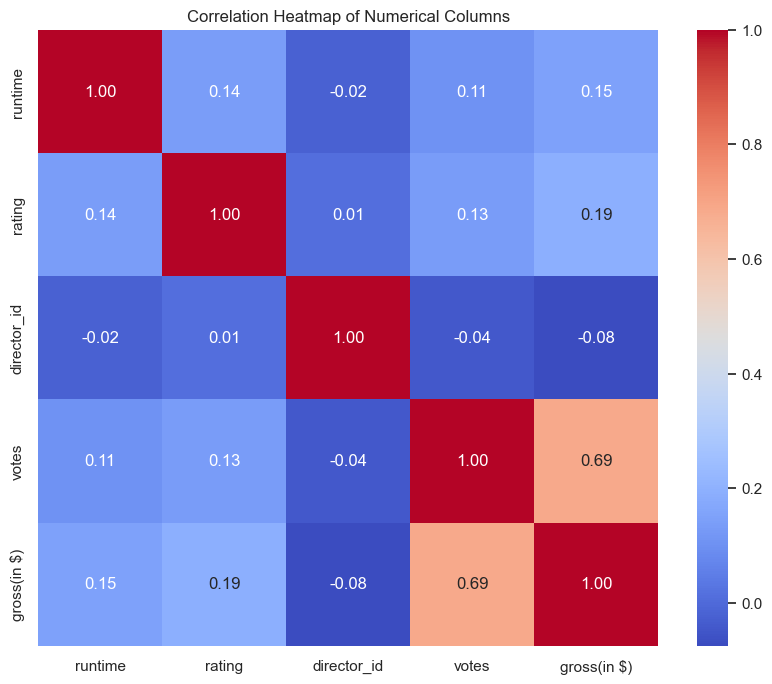

In [371]:
# Select only numerical columns
numerical_df = new_df[numerical_columns]

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Numerical Columns")
plt.show()

* There is strong correlation between gross and votes

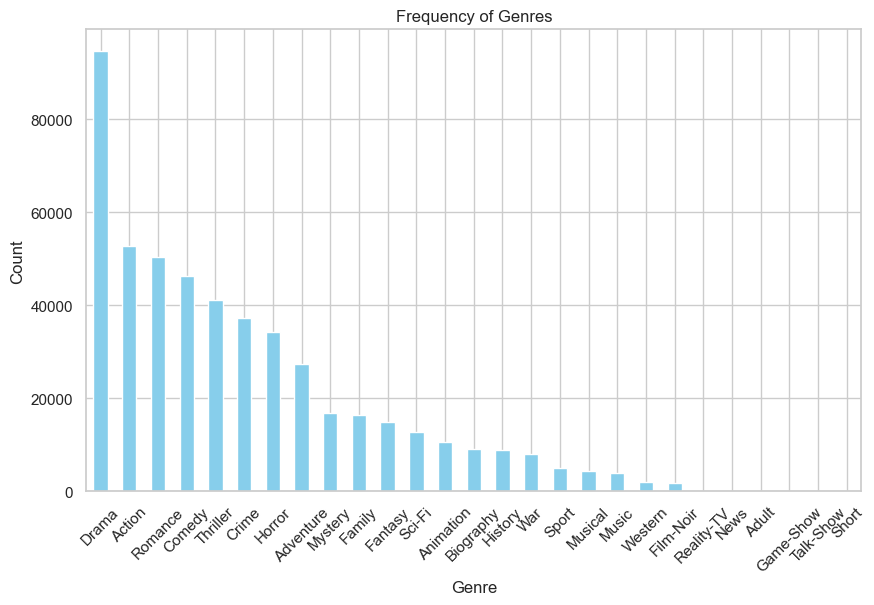

In [372]:
genres = new_df['genre'].str.split(', ').explode()

genre_counts = genres.value_counts()
plt.figure(figsize=(10, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('Frequency of Genres')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [373]:
# Splitting genres for each movie and counting the number of genres
genre_counts = new_df['genre'].str.split(',').apply(lambda x: len(x))

# Counting the occurrences of each genre count
genre_counts_counts = genre_counts.value_counts().sort_index()

# Creating a DataFrame to display the counts
genre_counts_df = pd.DataFrame({'Number of Movies': genre_counts_counts.values}, index=['Genre ' + str(count) for count in genre_counts_counts.index]).reset_index()
genre_counts_df= genre_counts_df.rename(columns = {'index' : 'Count'})
genre_counts_df


,Count,Number of Movies
0,Genre 1,75109
1,Genre 2,79135
2,Genre 3,88486


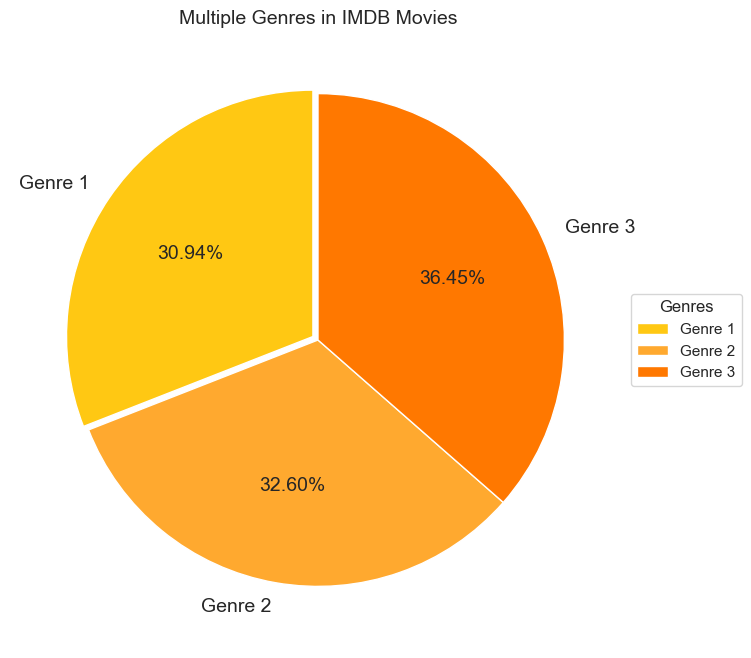

In [374]:
sizes = genre_counts_df['Number of Movies']
labels = genre_counts_df['Count']
colors = ['#ff7800' if size == sizes.max() else ('#ffc813' if size == sizes.min() else '#ffa92f') for size in sizes]

plt.figure(figsize=(8, 8))
plt.pie(sizes, autopct='%.2f%%', labels=labels, colors=colors, explode=(0.025, 0, 0), startangle=90, textprops={'fontsize': 14})
plt.legend(title='Genres', loc='right', bbox_to_anchor=(1.2, 0.5))
plt.title('Multiple Genres in IMDB Movies', fontdict={'fontsize': 14})
plt.show()

* Most of the movies in data are drama movies

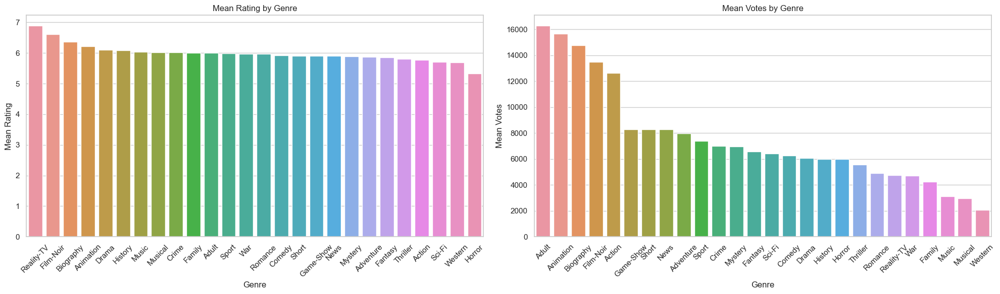

In [375]:
# Calculate mean rating and mean votes by genre
genre_means = new_df.groupby('Main_genre').agg({'rating': 'mean', 'votes': 'mean'}).reset_index()
genre_means = genre_means.sort_values(by=['rating'], ascending=False).reset_index(drop=True)
genre_vote_means = genre_means.sort_values(by=['votes'], ascending=False).reset_index(drop=True)

# Plotting
plt.figure(figsize=(20, 6))

plt.subplot(1, 2, 1)
sns.barplot(x='Main_genre', y='rating', data=genre_means)
plt.title('Mean Rating by Genre')
plt.xlabel('Genre')
plt.ylabel('Mean Rating')
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
sns.barplot(x='Main_genre', y='votes', data=genre_vote_means)
plt.title('Mean Votes by Genre')
plt.xlabel('Genre')
plt.ylabel('Mean Votes')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [377]:
fig = px.scatter_3d(new_df, x='rating', y='runtime', z='votes',
              color='Age_category')
# fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [376]:
columns = ['year', 'runtime','rating', 'director', 'votes',
       'gross(in $)', 'star_1', 'star_2', 'star_3', 'star_4', 'Decade',
       'Runtime_category', 'Main_genre', 'Age_category']

In [378]:
for col in new_df['Main_genre'].unique():
    desired_genre = col  # Change this to your desired genre
    genre_data = new_df[new_df['Main_genre'].str.contains(desired_genre, case=False)]
    
    # Filter out rows where star is 'Unknown'
    genre_data = genre_data[genre_data['star_1'] != 'Unknown']
    genre_data = genre_data[genre_data['star_2'] != 'Unknown']
    genre_data = genre_data[genre_data['star_3'] != 'Unknown']

    # Step 2: Concatenate star columns
    stars = pd.concat([genre_data['star_1'].str.strip(), genre_data['star_2'].str.strip(), genre_data['star_3'].str.strip()])

    # Step 3: Count occurrences of each star
    star_counts = stars.value_counts()

    # Step 4: Sort stars based on counts
    most_popular_stars = star_counts.head(10)  # Adjust the number as per your preference
    
    # Display the top 10 most popular stars as a table
    print(f"Top 10 Most Popular Stars in {desired_genre} Genre:")
    print(most_popular_stars)
    print("\n")


Top 10 Most Popular Stars in Action Genre:
Fernando Poe Jr.      187
Mithun Chakraborty    181
Eddie Garcia          156
Dharmendra            152
Mario Almada          132
Paquito Diaz          119
Sanjay Dutt           117
Joseph Estrada        114
Amitabh Bachchan      110
Mohanlal              109
Name: count, dtype: int64


Top 10 Most Popular Stars in Animation Genre:
Minami Takayama       58
Masako Nozawa         54
Tōru Furuya           53
Kana Hanazawa         49
Noriko Ohara          49
Nobuyo í”yama         46
Toshio Furukawa       46
Keiji Fujiwara        46
Wakana Yamazaki       43
Megumi Hayashibara    42
Name: count, dtype: int64


Top 10 Most Popular Stars in Drama Genre:
Sung-il Shin       78
Türkan Soray       73
Ashok Kumar        71
Hülya Koçyigit     60
Filiz Akin         53
Vilma Santos       53
Rajesh Khanna      51
Yeong-gyun Shin    50
Jeetendra          50
Cüneyt Arkin       49
Name: count, dtype: int64


Top 10 Most Popular Stars in Comedy Genre:
Cary Grant  

In [ ]:
for col in new_df['Main_genre'].unique():
    desired_genre = col  # Change this to your desired genre
    genre_data = new_df[new_df['Main_genre'].str.contains(desired_genre, case=False)]
    
    # Filter out rows where director is 'Unknown'
    genre_data = genre_data[genre_data['director'] != 'Unknown']

    # Step 2: Concatenate director columns
    directors = pd.concat([genre_data['director'].str.strip()])

    # Step 3: Count occurrences of each director
    director_counts = directors.value_counts()

    # Step 4: Sort directors based on counts
    most_popular_directors = director_counts.head(10)  # Adjust the number as per your preference
    
    # Display the top 10 most popular directors as a table
    print(f"Top 10 Most Popular Directors in {desired_genre} Genre:")
    print(most_popular_directors)
    print("\n")


* Counting genres from all genres (not only from Main genre)

In [379]:
#step 1 (separating each items by commas)
list_first = []
for value in new_df['genre']:
    genres = value.split(',')
    list_first.append([genre.strip() for genre in genres])

In [380]:
#since list_first is two-dimensional, it needs to be converted in one-dimensional
oneD_list=[]
for item1 in list_first:
    for item in item1:
        oneD_list.append(item)
        

In [381]:
from collections import Counter
Counter(oneD_list)

Counter({'Drama': 94664,
         'Action': 52836,
         'Romance': 50415,
         'Comedy': 46276,
         'Thriller': 41233,
         'Crime': 37231,
         'Horror': 34189,
         'Adventure': 27461,
         'Mystery': 16813,
         'Family': 16430,
         'Fantasy': 14986,
         'Sci-Fi': 12766,
         'Animation': 10512,
         'Biography': 9100,
         'History': 8794,
         'War': 7939,
         'Sport': 5015,
         'Musical': 4301,
         'Music': 4042,
         'Western': 1927,
         'Film-Noir': 1838,
         'Reality-TV': 32,
         'News': 18,
         'Adult': 7,
         'Game-Show': 5,
         'Talk-Show': 5,
         'Short': 2})

In [382]:
len(df['Main_genre'].unique())

KeyError: 'Main_genre'

In [ ]:
new_df.info()

## Numerical column Distributions

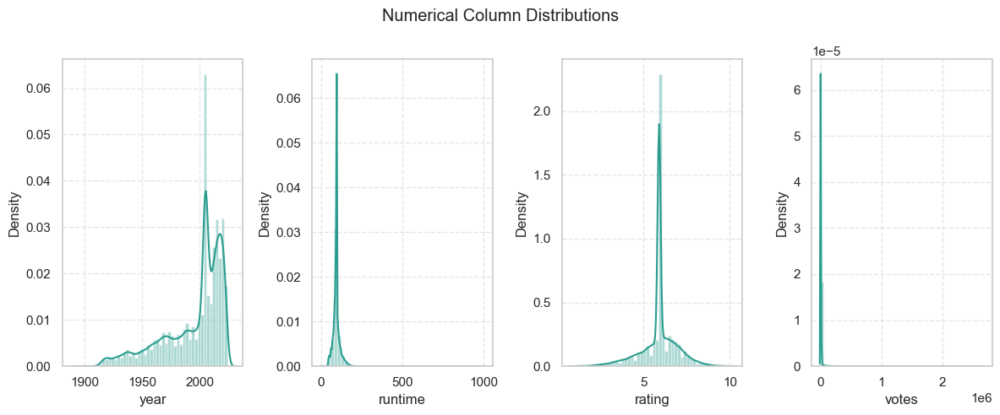

In [383]:
numerical = ['year', 'runtime', 'rating', 'votes']

plt.figure(figsize=(12,5))
for i in range(len(numerical)):
    plt.subplot(1, len(numerical), i + 1)
    sns.distplot(x=new_df[numerical[i]], color='#2a9d8f')
    plt.grid(True, linestyle='dashed', alpha=0.5)
    plt.xlabel(numerical[i])
plt.suptitle('Numerical Column Distributions')

plt.tight_layout()
plt.show()

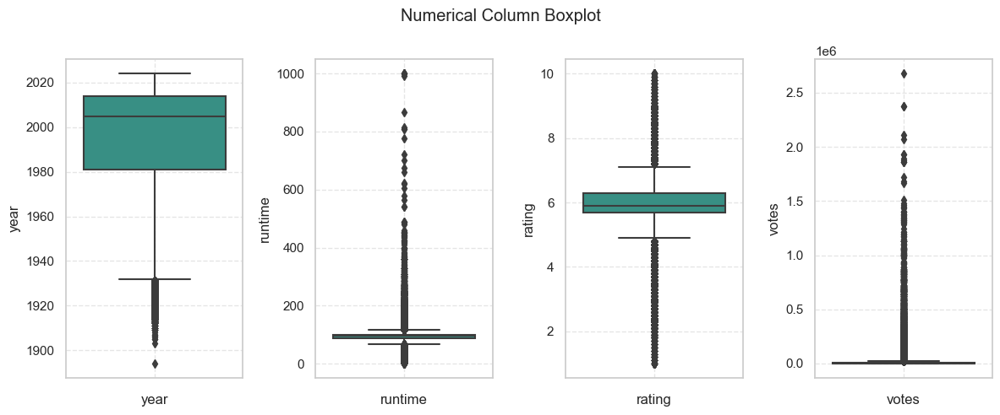

In [384]:
plt.figure(figsize=(12,5))
for i in range(len(numerical)):
    plt.subplot(1, len(numerical), i + 1)
    sns.boxplot(y=new_df[numerical[i]], color='#2a9d8f')
    plt.grid(True, linestyle='dashed', alpha=0.5)
    plt.xlabel(numerical[i])
plt.suptitle('Numerical Column Boxplot')

plt.tight_layout()
plt.show()

In [ ]:
new_df.head()

## Top 10 Movies with the Longest Duration

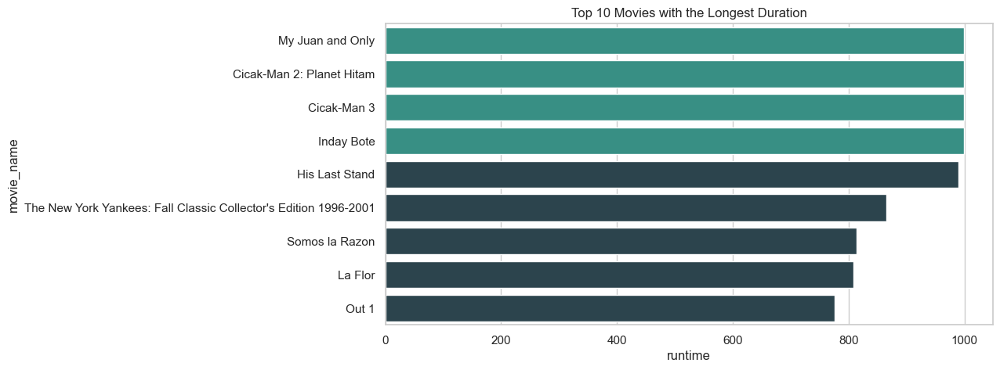

In [385]:
top10_longest = new_df[['movie_name','runtime']].sort_values('runtime', ascending=False).head(10)

plt.figure(figsize=(10,5))
ax = sns.barplot(x = top10_longest['runtime'], y = top10_longest['movie_name'], 
                 palette=np.where(top10_longest['runtime'] == np.max(top10_longest['runtime']), '#2a9d8f','#264653'))

plt.title('Top 10 Movies with the Longest Duration')
plt.show()

## Top 10 Movies with Highest Rating in IMdb Movies

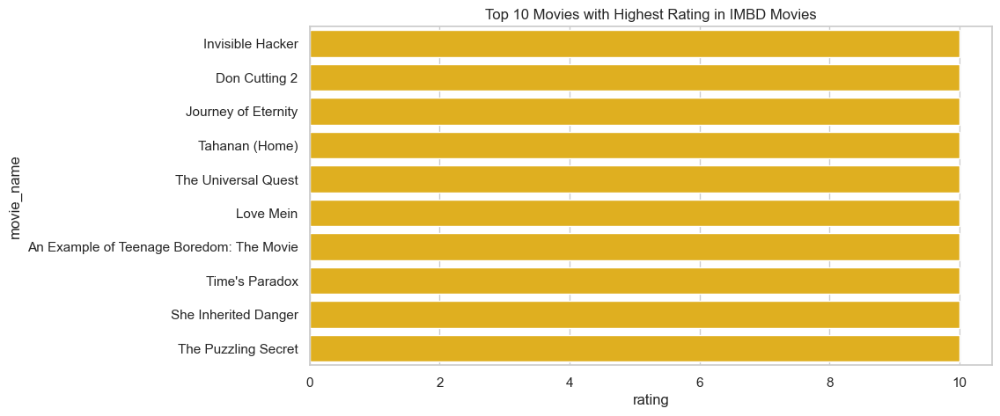

In [386]:
top10_rating = new_df[['movie_name','rating']].sort_values(by='rating', ascending=False).head(10)

plt.figure(figsize=(10,5))
ax = sns.barplot(x = top10_rating['rating'], y = top10_rating['movie_name'], 
                 palette=np.where(top10_rating['rating'] == np.max(top10_rating['movie_name']), '#9FE2BF','#FFBF00'))
# ax.bar_label(ax.containers[0], padding=5)
plt.title('Top 10 Movies with Highest Rating in IMBD Movies')
plt.show()

## Top 10 Movies with Highest Votes in IMdb Movies

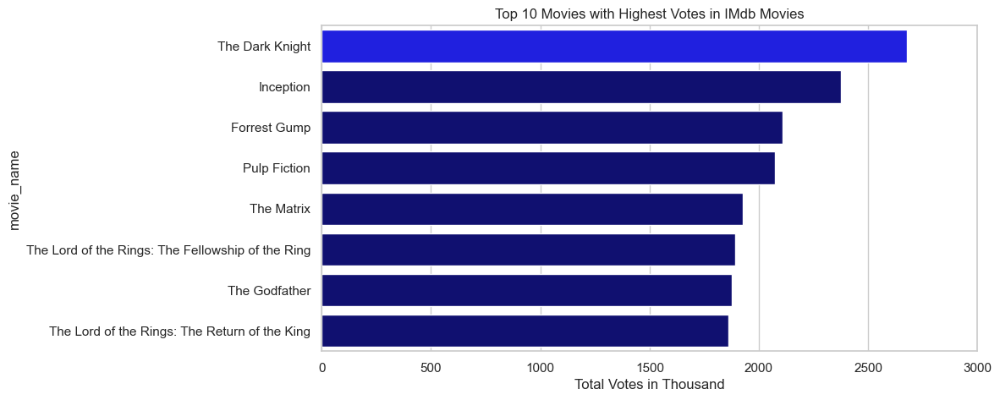

In [387]:
top10_votes = new_df[['movie_name','votes']].sort_values(by='votes', ascending=False).head(10)

plt.figure(figsize=(10,5))
ax = sns.barplot(x = top10_votes['votes'], y = top10_votes['movie_name'], 
                 palette=np.where(top10_votes['votes'] == np.max(top10_votes['votes']), '#0000FF','#000080'))

ax.set_xlabel('Total Votes in Thousand')
labels, location = plt.xticks()
plt.xticks(labels,(labels/1000).astype('int'))
plt.title('Top 10 Movies with Highest Votes in IMdb Movies')
plt.show()

## Top 5 highest rated movie title and directors

In [388]:
# Sort the DataFrame by rating in descending order and select the top 5 rows
highest_rated5 = new_df.nlargest(5, "rating")[["movie_name", "rating", "director"]]
fig = px.bar(highest_rated5, 
             x='rating', 
             y='movie_name', 
             color='director', 
             orientation='h',  # Horizontal orientation
             title='Top 5 Highest Rated Movies and Directors',
             labels={'rating': 'Rating', 'movie_name': 'Movie Name', 'director': 'Director'})
fig.show()

## Bottom 10 movies in IMdb Ratings

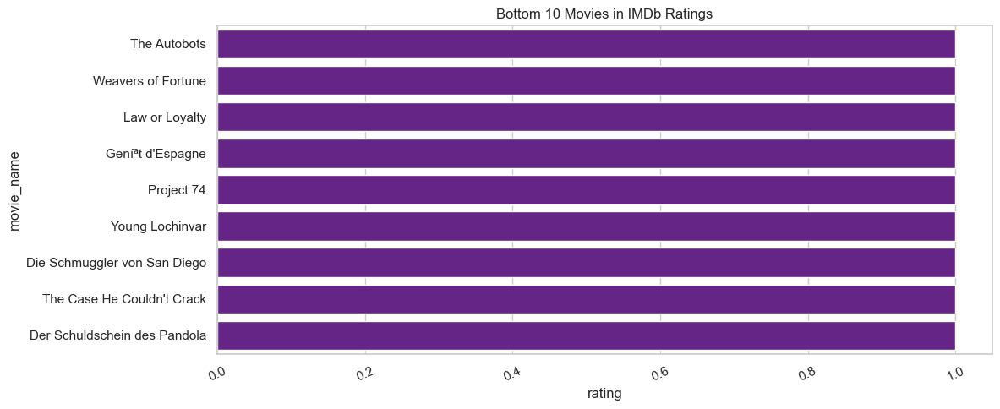

In [389]:
condition = new_df['rating'] < np.mean(new_df['rating'])
bottom10_rating = new_df[['movie_name', 'rating']].sort_values('rating', ascending=True).head(10)
bottom10_rating = bottom10_rating[condition]

plt.figure(figsize=(12, 5))
sns.barplot(data=bottom10_rating, x='rating', y='movie_name', 
            palette=np.where(bottom10_rating['rating'] < np.mean(bottom10_rating['rating']), '#2a9d8f', '#6a1596'))
plt.title('Bottom 10 Movies in IMDb Ratings')
plt.xticks(rotation=25)
plt.tight_layout()
plt.show()

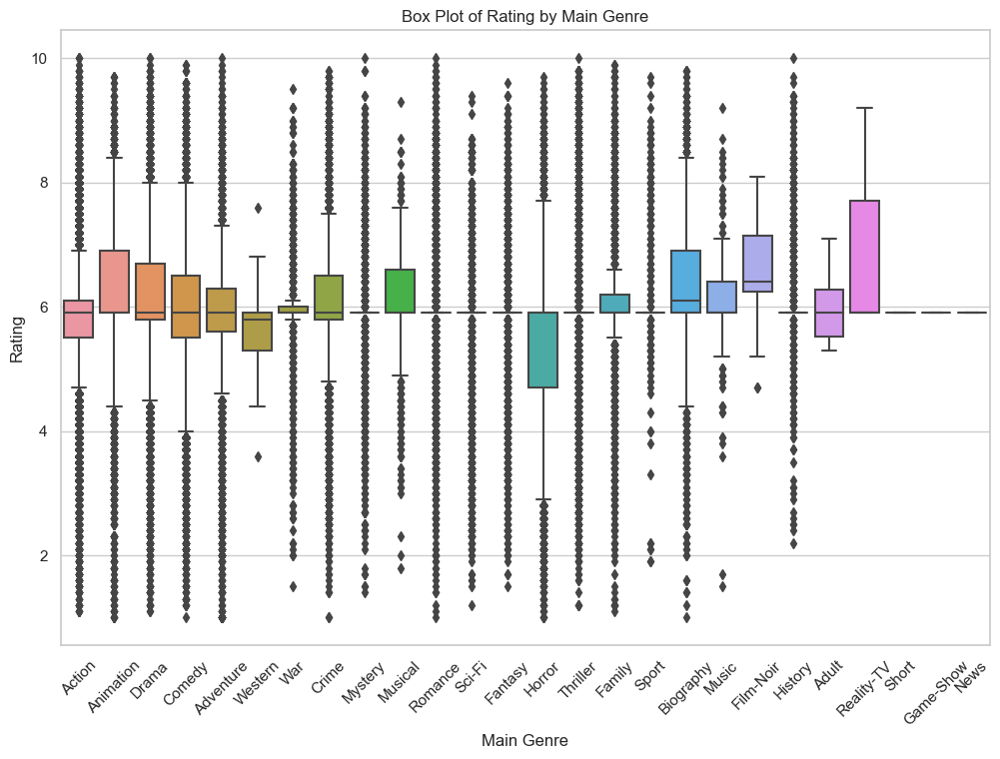

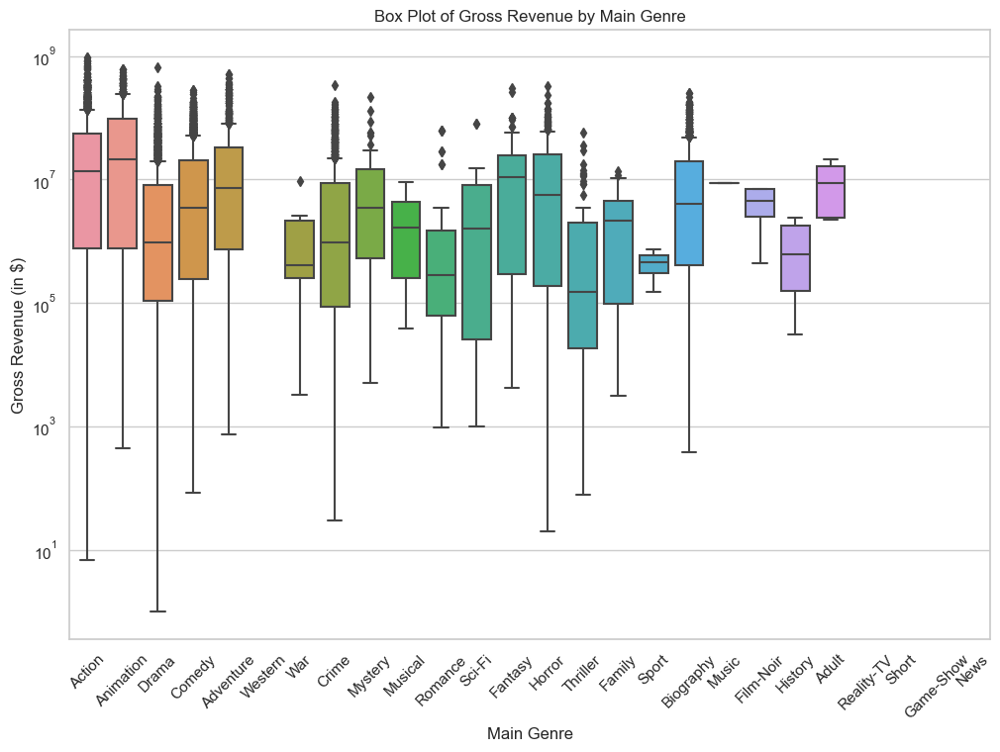

In [390]:
plt.figure(figsize=(12, 8))

# Create a box plot of 'rating' for each 'Main_genre'
sns.boxplot(data=new_df, x='Main_genre', y='rating')
plt.title('Box Plot of Rating by Main Genre')
plt.xlabel('Main Genre')
plt.ylabel('Rating')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# Create a box plot of 'gross(in $)' for each 'Main_genre'
plt.figure(figsize=(12, 8))
sns.boxplot(data=new_df, x='Main_genre', y='gross(in $)')
plt.title('Box Plot of Gross Revenue by Main Genre')
plt.xlabel('Main Genre')
plt.ylabel('Gross Revenue (in $)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.yscale('log')  # Set y-axis to log scale for better visualization of large values
plt.show()

# Handling Outliers

In [391]:
numerical_columns

['runtime', 'rating', 'director_id', 'votes', 'gross(in $)']

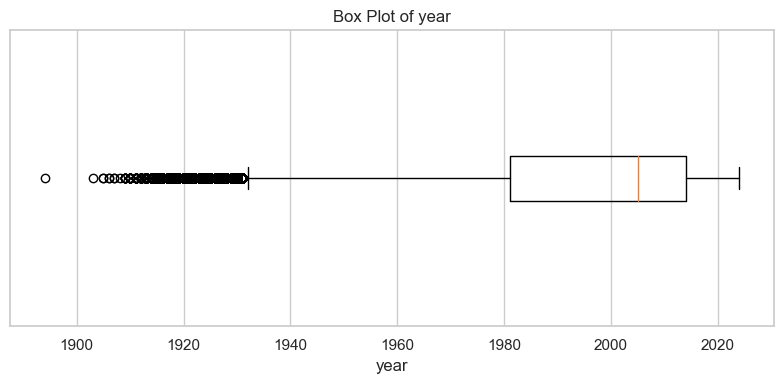

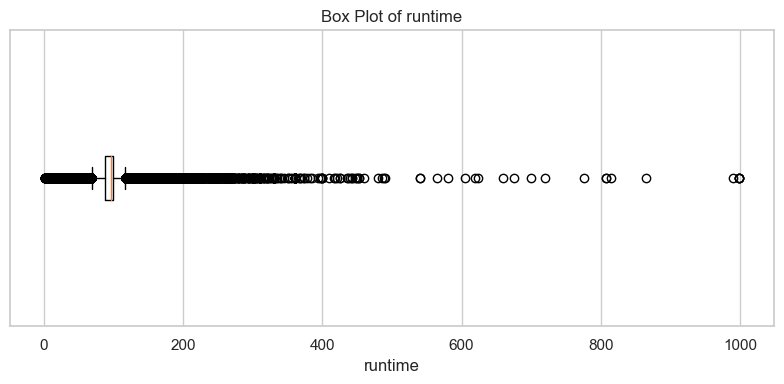

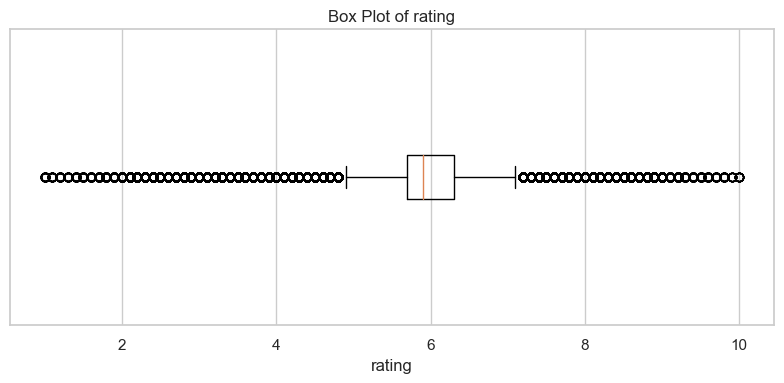

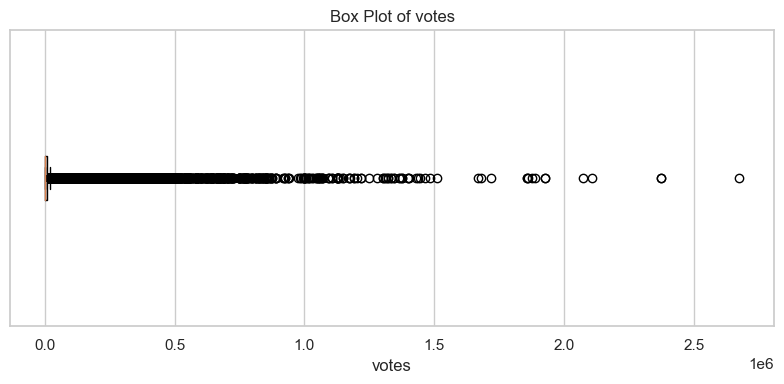

In [392]:
for i in ['year', 'runtime', 'rating','votes']:
    plt.figure(figsize=(8, 4))
    plt.boxplot(new_df[i], vert=False)
    plt.title(f'Box Plot of {i}')
    plt.xlabel(f'{i}')
    plt.yticks([])
    plt.tight_layout()
    plt.show()

* I do not think outliers should be handled?

In [393]:
def percentage_outliers(column):
    if pd.api.types.is_numeric_dtype(column):  # Check if column contains numeric data
        q1 = column.quantile(0.25)
        q3 = column.quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = column[(column < lower_bound) | (column > upper_bound)]
        return (len(outliers) / len(column)) * 100
    else:
        return 0  # Return 0 for non-numeric columns

# Calculate percentage of outliers for each column
percent_outliers = {}
for col in new_df.columns:
    percent_outliers[col] = percentage_outliers(new_df[col])

# Create DataFrame to store results
df_outliers = pd.DataFrame({
    'Column': list(percent_outliers.keys()),
    'Percent Outliers': list(percent_outliers.values())
})

print(df_outliers)

              Column  Percent Outliers
0           movie_id          4.726651
1         movie_name          0.000000
2               year          3.234046
3        certificate          0.000000
4            runtime         17.462201
5              genre          0.000000
6             rating         22.368475
7        description          0.000000
8           director          0.000000
9        director_id          8.291517
10             votes          3.316442
11       gross(in $)          0.725497
12            star_1          0.000000
13            star_2          0.000000
14            star_3          0.000000
15            star_4          0.000000
16            Decade          5.551024
17  Runtime_category          0.000000
18      Age_category          0.000000
19        Main_genre          0.000000


In [394]:
def replace_outliers(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    column = column.mask((column < lower_bound) | (column > upper_bound), column.median())
    return column

for col in ['year', 'Decade', 'votes']:
    new_df[col] = replace_outliers(new_df[col])

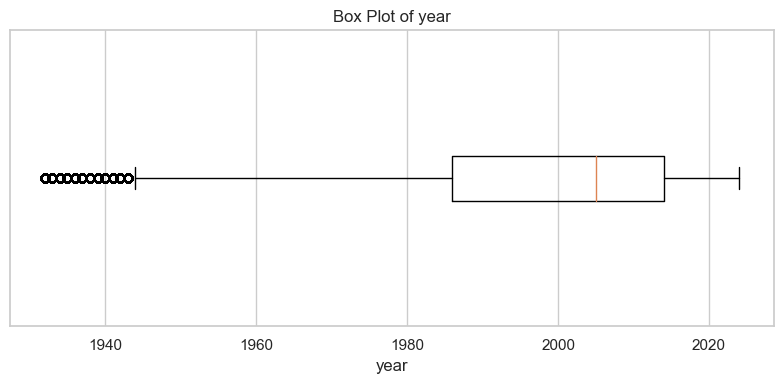

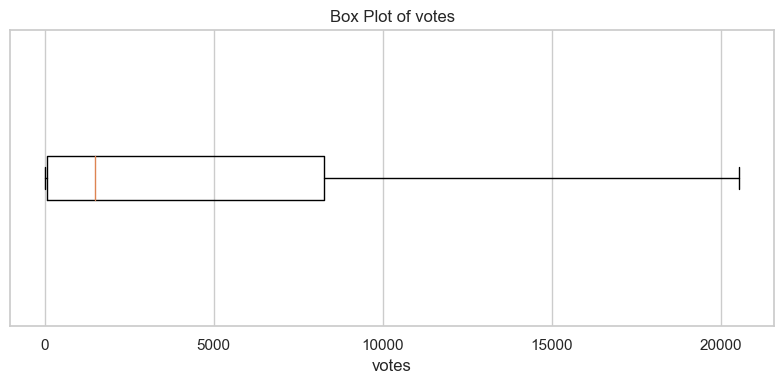

In [395]:
for i in ['year','votes']:
    plt.figure(figsize=(8, 4))
    plt.boxplot(new_df[i], vert=False)
    plt.title(f'Box Plot of {i}')
    plt.xlabel(f'{i}')
    plt.yticks([])
    plt.tight_layout()
    plt.show()

In [396]:
cols = ['movie_id', 'movie_name', 'year', 'certificate', 'runtime', 'genre',
       'rating', 'description', 'director', 'director_id', 'votes',
       'gross(in $)', 'star_1', 'star_2', 'star_3', 'star_4', 'Decade',
       'Runtime_category', 'Main_genre', 'Age_category']
for col in df.columns:
    if col not in cols:
        df = df.drop(col, axis = 1)

In [ ]:
df.info()

## Most Common Words in Movies Title

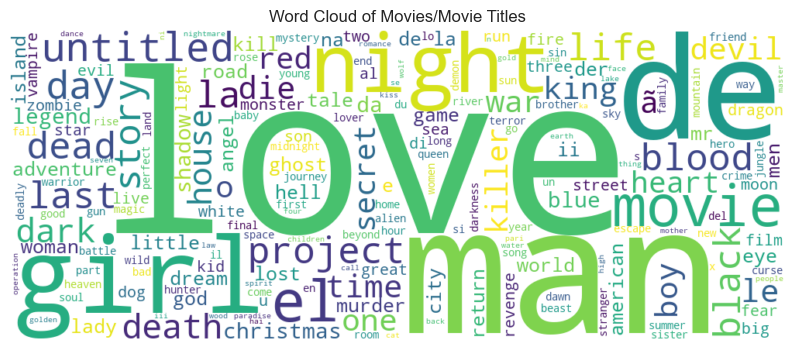

In [397]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS
df['movie_name'] =df['movie_name'].astype(str)
all_plot = ' '.join(df['movie_name'].dropna())

stopwords = set(STOPWORDS)
processed_text = ' '.join([word.lower() for word in all_plot.split() if word.lower() not in stopwords])
wordcloud = WordCloud(width=1000, height=400, background_color='white').generate(processed_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title('Word Cloud of Movies/Movie Titles')
plt.show()

# Data Preprocessing

## Encoding

In [398]:
encoded_df = new_df.copy() #encoded df

In [399]:
#Define columns and their respective encoding methods
label_encoder = LabelEncoder()
encoded_df['Runtime_category'] = label_encoder.fit_transform(encoded_df['Runtime_category'])

1. **Action & Adventure**: Both are characterized by thrilling, fast-paced narratives often involving physical feats and excitement.

2. **Comedy, Animation & Family**: Both aim to entertain with humor and light-hearted themes suitable for all ages.

3. **Drama & Romance**: Both explore human emotions, relationships, and interpersonal conflicts.

4. **Sci-Fi & Fantasy**: Both delve into speculative and imaginative concepts, often in futuristic or fantastical settings.

5. **Crime, Mystery, & Thriller**: These genres focus on suspenseful plots, detective work, and exploration of criminal activities or puzzles.

6. **Horror & Short**: Known for evoking fear and suspense through supernatural or psychological elements.

7. **Biography,History, Western & War**: Both are grounded in real events, people, and places, portraying factual accounts or interpretations of past events or lives.

8. **Music & Musical**: Both heavily feature music, with music genre films focusing on musicians or the music industry, and musicals incorporating songs and dance numbers into storytelling.

9. **Sport, News, Talk-Show, Reality-TV, Game-Show**: These genres are typically associated with television programming rather than traditional narrative storytelling.

In [400]:
encoded_df.columns

Index(['movie_id', 'movie_name', 'year', 'certificate', 'runtime', 'genre',
       'rating', 'description', 'director', 'director_id', 'votes',
       'gross(in $)', 'star_1', 'star_2', 'star_3', 'star_4', 'Decade',
       'Runtime_category', 'Age_category', 'Main_genre'],
      dtype='object')

* Label encoding for grouped_genre

In [401]:
# Encode 'movie_name' with 'movie_id' values
encoded_df['movie_name_encoded'] = encoded_df['movie_id']

In [402]:
encoded_df.tail(10)

,movie_id,movie_name,year,certificate,runtime,genre,rating,description,director,director_id,votes,gross(in $),star_1,star_2,star_3,star_4,Decade,Runtime_category,Age_category,Main_genre,movie_name_encoded
257017,144952,O gyrismos tou stratioti,1966,Unknown,80.000000,"Drama, War",2.6,Add a Plot,Giorgos Lois,517986,8,NaN,Alexandra Ladikou,Kostas Kazakos,Tonis Batanikas,Serafeim Evangelou,1960,0,NaN,Drama,144952
257018,4458802,Otome no ire Kichi,1945,Unknown,95.648017,"Drama, War",5.9,Add a Plot,Yasushi Sasaki,765832,8270,NaN,Unknown,Unknown,Unknown,Unknown,1940,0,NaN,Drama,4458802
257019,308420,Istiklal madalyasi,1948,Unknown,95.648017,"Drama, War",6.7,A heroism set during the War of Independence.,Ferdi Tayfur,1088596,11,NaN,Cahit Irgat,Handan Adali,Halit Akçatepe,Orhon Murat Ariburnu,1940,0,NaN,Drama,308420
257020,10674742,Shutsugeki,1964,Unknown,100.000000,War,5.9,Add a Plot,Eisuke Takizawa,847695,8270,NaN,Takao Ito,Daisaburō Hirata,Shinji Kanai,Hisayoshi Yamane,1960,0,NaN,War,10674742
257021,351402,Na dorogakh voyny,1959,Unknown,95.648017,War,5.7,Add a Plot,Lev Saakov,754286,14,NaN,Vsevolod Sanaev,Anatoliy Kuznetsov,Yury Solovyov,Evgeniy Shutov,1950,0,NaN,War,351402
257022,5033220,Opération Maillot,2015,Unknown,95.648017,War,5.9,Add a Plot,Okacha Touita,869536,8270,NaN,Martin Pautard,Mohamed Seghir Bendaoud,Matthieu Brion,Colette Kraffe,2010,0,NaN,War,5033220
257023,9655,Stolen Orders,2005,Unknown,80.000000,"War, Drama",4.6,A renegade American and his innocent daughter ...,Ryan Coogler,447094,15,NaN,Montagu Love,Kitty Gordon,June Elvidge,Carlyle Blackwell,2000,0,NaN,War,9655
257024,26684378,Dalilah,2005,Unknown,95.648017,War,5.9,Add a Plot,Lee Beebe,14548955,8270,NaN,Paul Forrest Quinn,Linus Ignatius,Erich Rausch,Marguerite Zwahlen,2000,0,NaN,War,26684378
257025,26690183,World War 1 project,2005,Unknown,95.648017,War,5.9,Add a Plot,Ryan Coogler,3836407,8270,NaN,Unknown,Unknown,Unknown,Unknown,2000,0,NaN,War,26690183
257027,26733697,Spion 11: Operasjon Traelandsfos,2001,Unknown,75.000000,"Comedy, War",5.9,Add a Plot,Ryan Coogler,14562635,8270,NaN,Andreas Hansen,Tom Galdal,Jarle Solberg,Ove Olsen,2000,0,NaN,Comedy,26733697


In [403]:
encoded_df.dropna(subset=['movie_id'], inplace=True)

In [404]:
encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 242730 entries, 0 to 257027
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   movie_id            242730 non-null  int64  
 1   movie_name          242730 non-null  object 
 2   year                242730 non-null  int64  
 3   certificate         242730 non-null  object 
 4   runtime             242730 non-null  float64
 5   genre               242730 non-null  object 
 6   rating              242730 non-null  float64
 7   description         242730 non-null  object 
 8   director            242730 non-null  object 
 9   director_id         242730 non-null  int32  
 10  votes               242730 non-null  int32  
 11  gross(in $)         15221 non-null   float64
 12  star_1              242730 non-null  object 
 13  star_2              242730 non-null  object 
 14  star_3              242730 non-null  object 
 15  star_4              242730 non-null  ob

In [405]:
encoded_df.columns

Index(['movie_id', 'movie_name', 'year', 'certificate', 'runtime', 'genre',
       'rating', 'description', 'director', 'director_id', 'votes',
       'gross(in $)', 'star_1', 'star_2', 'star_3', 'star_4', 'Decade',
       'Runtime_category', 'Age_category', 'Main_genre', 'movie_name_encoded'],
      dtype='object')

In [406]:
df.columns

Index(['movie_id', 'movie_name', 'year', 'certificate', 'runtime', 'genre',
       'rating', 'description', 'director', 'director_id', 'votes',
       'gross(in $)'],
      dtype='object')

In [407]:
['director', 'star_1', 'star_2', 'star_3', 'star_4']

['director', 'star_1', 'star_2', 'star_3', 'star_4']

* Values to replace with 'Unknown' in certificate column (it must be done before label encoding)

In [408]:
# Values to replace with 'Unknown'
values_to_replace = ['Not Rated', 'Unrated', 'Passed', 'GP', 'E', 'E10+', 'Open', 'F', 'A']

# Replace values with 'Unknown'
new_df['certificate'] = new_df['certificate'].replace(values_to_replace, 'Unknown')
encoded_df['certificate'] = encoded_df['certificate'].replace(values_to_replace, 'Unknown')

# Check unique values in 'certificate' column
print(new_df['certificate'].unique())

['PG-13' 'R' 'Unknown' 'TV-MA' 'PG' 'TV-14' '18+' 'Approved' '13+' 'G'
 'M/PG' 'M' 'TV-PG' 'TV-Y7' 'TV-G' 'NC-17' '16+' 'X' 'TV-Y7-FV' 'TV-Y' 12
 'MA-13' 'T' 'AO' 'TV-13' 'U' 'MA-17' 18 'UA 7+' 'UA' 'UA 16+' 13 16 7
 'UA 13+' 'All']


In [409]:
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
movie_id,242730.0,4.916359e+06,6.108366e+06,9.0,230590.25,2.199579e+06,7716306.00,27055121.0
year,242730.0,1.997607e+03,2.233753e+01,1932.0,1986.00,2.005000e+03,2014.00,2024.0
runtime,242730.0,9.564805e+01,2.243656e+01,1.0,87.00,9.564802e+01,99.00,999.0
rating,242730.0,5.896763e+00,1.040494e+00,1.0,5.70,5.900000e+00,6.30,10.0
director_id,242730.0,2.589810e+06,3.281021e+06,5.0,407648.00,9.459810e+05,3700324.75,14631840.0
votes,242730.0,3.770238e+03,4.025118e+03,5.0,81.00,1.480000e+03,8270.00,20553.0
gross(in $),15221.0,2.715860e+07,6.094870e+07,1.0,265801.00,3.796699e+06,26483452.00,936662225.0
Decade,242730.0,1.994695e+03,2.038218e+01,1940.0,1980.00,2.000000e+03,2010.00,2020.0


In [410]:
encoded_df['Age_category'] = encoded_df['Age_category'].astype(str)

In [411]:
encoded_df['certificate'] = encoded_df['certificate'].astype(str)

In [412]:
# Label encoding for 'certificate' and 'Age_category'
label_encoder = LabelEncoder()
encoded_df['certificate_encoded'] = label_encoder.fit_transform(encoded_df['certificate'])
encoded_df['Age_category_encoded'] = label_encoder.fit_transform(encoded_df['Age_category'])

* Directors column encoded with frequency encoding

In [413]:
director_frequency = encoded_df['director'].value_counts(normalize=True)

# Replace categories with frequencies
encoded_df['director_encoded'] = encoded_df['director'].map(director_frequency)

In [414]:
encoded_df.head()

,movie_id,movie_name,year,certificate,runtime,genre,rating,description,director,director_id,votes,gross(in $),star_1,star_2,star_3,star_4,Decade,Runtime_category,Age_category,Main_genre,movie_name_encoded,certificate_encoded,Age_category_encoded,director_encoded
0,9114286,Black Panther: Wakanda Forever,2022,PG-13,161.000000,"Action, Adventure, Drama",6.9,The people of Wakanda fight to protect their h...,Ryan Coogler,3363032,1480,NaN,Letitia Wright,Lupita Nyong'o,Danai Gurira,Winston Duke,2020,1,teens,Action,9114286,18,5,0.119627
1,1630029,Avatar: The Way of Water,2022,PG-13,192.000000,"Action, Adventure, Fantasy",7.8,Jake Sully lives with his newfound family form...,James Cameron,116,1480,NaN,Sam Worthington,Zoe Saldana,Sigourney Weaver,Stephen Lang,2020,1,teens,Action,1630029,18,5,0.000078
2,5884796,Plane,2023,R,107.000000,"Action, Thriller",6.5,A pilot finds himself caught in a war zone aft...,Jean-François Richet,724938,1480,NaN,Gerard Butler,Mike Colter,Tony Goldwyn,Yoson An,2020,0,adults,Action,5884796,19,0,0.000045
3,6710474,Everything Everywhere All at Once,2022,R,139.000000,"Action, Adventure, Comedy",8.0,A middle-aged Chinese immigrant is swept up in...,Ryan Coogler,3453283,1480,NaN,Michelle Yeoh,Stephanie Hsu,Jamie Lee Curtis,Ke Huy Quan,2020,0,adults,Action,6710474,19,0,0.119627
4,5433140,Fast X,2023,Unknown,95.648017,"Action, Crime, Mystery",5.9,Dom Toretto and his family are targeted by the...,Louis Leterrier,504642,8270,NaN,Vin Diesel,Jordana Brewster,Tyrese Gibson,Michelle Rodriguez,2020,0,nan,Action,5433140,34,3,0.000062


* Stars columns encoded with frequency encoding

In [415]:
star_1_frequency = encoded_df['star_1'].value_counts(normalize=True)
star_2_frequency = encoded_df['star_2'].value_counts(normalize=True)
star_3_frequency = encoded_df['star_3'].value_counts(normalize=True)
star_4_frequency = encoded_df['star_4'].value_counts(normalize=True)

# Replace categories with frequencies for each column
encoded_df['star_1_encoded'] = encoded_df['star_1'].map(star_1_frequency)
encoded_df['star_2_encoded'] = encoded_df['star_2'].map(star_2_frequency)
encoded_df['star_3_encoded'] = encoded_df['star_3'].map(star_3_frequency)
encoded_df['star_4_encoded'] = encoded_df['star_4'].map(star_4_frequency)


In [ ]:
# encoded_df = encoded_df.drop('Main_genre', axis = 1)

* Changing type of the columns

In [416]:
columns_to_int = ['year', 'director_id', 'votes', 'Decade', 'Runtime_category', 'runtime']

for column in columns_to_int:
    encoded_df[column] = encoded_df[column].astype(int)

In [418]:
encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 242730 entries, 0 to 257027
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   movie_id              242730 non-null  int64  
 1   movie_name            242730 non-null  object 
 2   year                  242730 non-null  int32  
 3   certificate           242730 non-null  object 
 4   runtime               242730 non-null  int32  
 5   genre                 242730 non-null  object 
 6   rating                242730 non-null  float64
 7   description           242730 non-null  object 
 8   director              242730 non-null  object 
 9   director_id           242730 non-null  int32  
 10  votes                 242730 non-null  int32  
 11  gross(in $)           15221 non-null   float64
 12  star_1                242730 non-null  object 
 13  star_2                242730 non-null  object 
 14  star_3                242730 non-null  object 
 15  star_

In [417]:
encoded_df.columns

Index(['movie_id', 'movie_name', 'year', 'certificate', 'runtime', 'genre',
       'rating', 'description', 'director', 'director_id', 'votes',
       'gross(in $)', 'star_1', 'star_2', 'star_3', 'star_4', 'Decade',
       'Runtime_category', 'Age_category', 'Main_genre', 'movie_name_encoded',
       'certificate_encoded', 'Age_category_encoded', 'director_encoded',
       'star_1_encoded', 'star_2_encoded', 'star_3_encoded', 'star_4_encoded'],
      dtype='object')

 ## Splitting the data

In [419]:
encoded_df.isnull().sum().sum() #Only null values in gross column

227509

In [421]:
X.isnull().sum()

year                    0
Age_category_encoded    0
runtime                 0
rating                  0
director_encoded        0
votes                   0
star_1_encoded          0
star_2_encoded          0
star_3_encoded          0
star_4_encoded          0
dtype: int64

# Modelling

In [424]:
new_df1 = new_df.copy()

In [426]:
# # Assuming X is your feature DataFrame and encoded_df contains your data
# X = new_df1[['year', 'Age_category_encoded', 'runtime', 'rating', 'director_encoded', 'votes', 'gross(in $)',  'star_1_encoded', 'star_2_encoded', 'star_3_encoded', 'star_4_encoded']]

# # Grouped genres based on thematic similarities or common genre combinations
# grouped_genres = {
#     'Drama/Romance': ['Drama', 'Romance'],
#     'Action/Adventure/Sci-Fi': ['Action', 'Adventure', 'Sci-Fi'],
#     'Comedy/Family': ['Comedy', 'Family'],
#     'Crime/Thriller/Mystery': ['Crime', 'Thriller', 'Mystery', 'Film-Noir'],
#     'Animation/Fantasy': ['Animation', 'Fantasy'],
#     'Horror/Short': ['Horror', 'Short'],
#     'Music/Musical': ['Music', 'Musical'],
#     'Biography/History': ['Biography', 'History', 'War'],
#     'Western': ['Western'],
#     'Television' : ['News', 'Sport', 'Reality-TV', 'Talk-Show', 'Game-Show'],
#     'Adult': ['Adult']
# }

# # Convert genre labels into binary array format using MultiLabelBinarizer
# mlb = MultiLabelBinarizer()
# y = mlb.fit_transform(new_df1['genre'].apply(lambda x: [genre for genre, grouped_genre in grouped_genres.items() if any(g in x for g in grouped_genre)]))

# # Split the data into training and testing sets (80% train, 20% test)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Cleaned dataset without encoding for modelling 
# new_df.to_excel('cleaned_dataset.xlsx', index=False)